 # ATM 641: Mountain Meteorology - Coding Exercise

The overarching goal of SNOWIE (Seeded and Natural Orographic Wintertime Clouds: The Idaho Experiment) was to understand the natural dynamical and microphysical processes by which precipitation forms and evolves within orographic winter storms and to determine the physical processes by which cloud seeding with silver iodide (AgI), either from ground generators or aircraft, impacts the amount and spatial distribution of snow falling across a river basin. SNOWIE was conducted over the Payette Mountains in Idaho and partners with Idaho Power Company (IPC) who maintain an operational seeding program in the region.

The core scientific objectives of the project were to: (1) Evaluate the role of mesoscale and microscale dynamics and of the underlying terrain in the formation, growth, and fallout of natural ice crystals in winter storms through observations; (2) Investigate how the natural snow growth process is altered as a result of airborne AgI seeding through both observations and model simulations, and (3) Evaluate the effects of ground seeding on snowfall amount and distribution.

During SNOWIE the UWKA flew back-and-forth flight legs along one of three flight tracks. One flight leg was typically completed in 10–20 min, with 4-h flights typically completing 10–14 flight legs.

This assignment will be focused on the role of mesoscale dynamics and of the underlying terrain on updrafts observed over the region. 

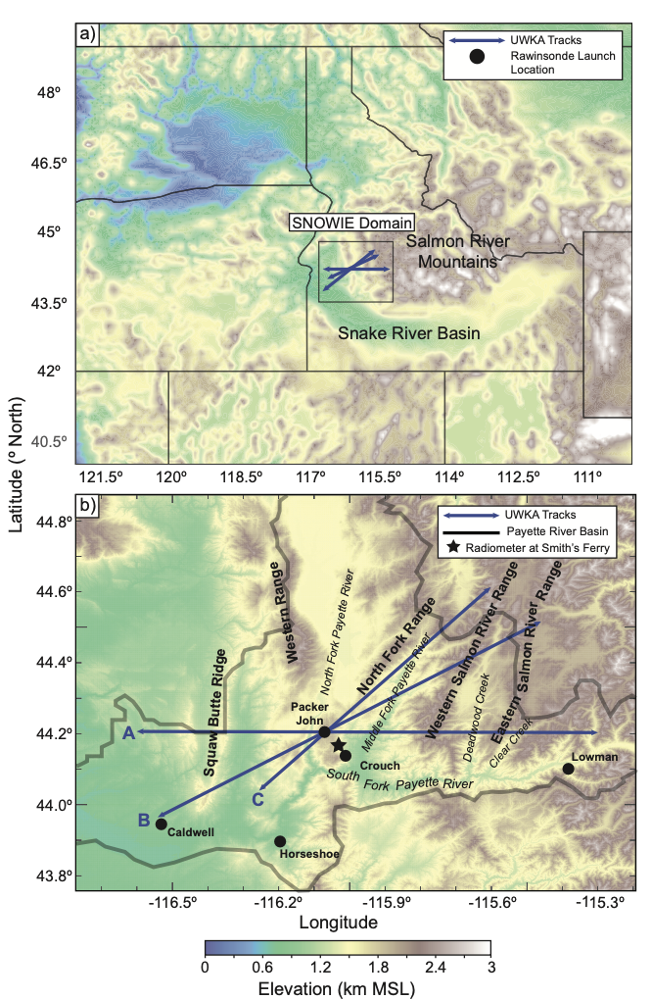

Vertical air motion is a key variable in atmospheric dynamics and cloud microphysics studies. It directly relates the kinematic forcing and the microphysical evolution of clouds.  

Retrieval of vertical air motion with Doppler radars has been the primary goal of atmospheric research since these radars were first deployed to study atmospheric processes as precipitation in clouds is largerly controlled by updraft speed.  

The presence/formation of supercooled liquid water is often associated with vertical air motions. Supercooled liquid water occurs in clouds where ice nucleation mechanisms are inefficient, in clouds with base temperatures > 0 degrees Celsius where ascent of cloud water occurs through the 0 degrees Celsius level, or if clouds have sufficiently strong updrafts such that the condensate supply rate exceeds the diffusional growth rate of ice. 


# Why are vertically pointing Doppler radars useful? 

An airborne vertically pointing Doppler radar measures the motion toward or away from the beam. On an airborne platform, the direction the beam is pointing can be affected by the pitch, roll, and yaw of the aircraft.  

1. Pitch - motion is up or down movement of the nose of the aircraft
2. Roll - up or down movement of the wings (rotation of the aircraft abot the vertical axis) 
3. Yaw - side to side movement (left to right movement) of the nose of the aircraft.  

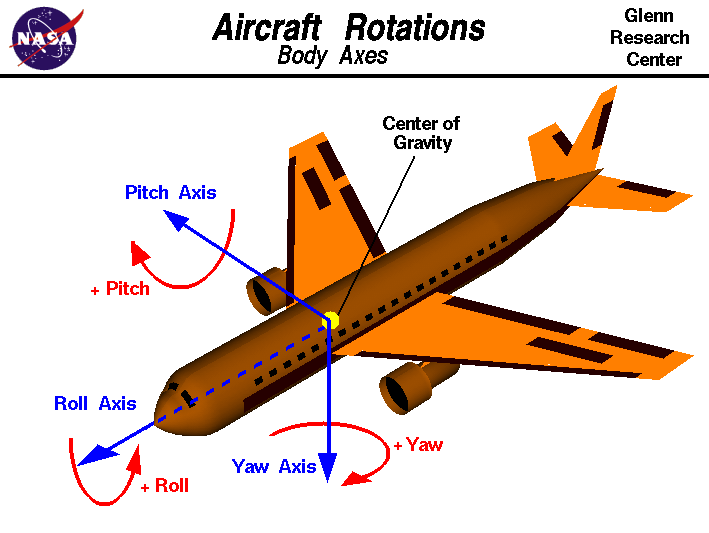
 
When a nominally vertically-pointing beam is actually oriented in a direction other than up or down and not orthogonal (perpendicular) to the aircraft velocity vector, the horizontal winds and the aircraft motion will contribute to the measured radial velocity.  

Measured radial velocity is the sum of the vertical air motion (which we are after), the reflectivity weighted particle terminal velocity, a component of the horizontal wind if the beam was not pointed vertically, and a component of the aircraft motion that was projected into the beam if the beam wasn't orthogonal to the aircraft velocity vector.

Because we know the pitch, roll, and yaw of the aircraft - the aircraft motion contribution can be easily removed using standard processing and typically is prior to radial velocity data being provided to the user.  

Correcting radial velocity for platform motion requires knowledge of the radar antenna beam pointing vector and a coordinate transformation between the aircraft body fixed-reference frame and the ground fixed-reference frame.  Why do we need a coordinate transform? Wind speed is in the ground relative reference frame.  The transformation matrix takes into account how the pitch, roll, yaw, and aircraft ground speed will change in the new reference frame.  This will allow us to estimate the contribution of the horizontal wind at a given height to measured radial velocities and allows us to subtract out the contribution of the horizontal wind from individual range gates given a beams pitch, roll, and yaw. This step is often left to the user of the data.  You then typically have three options for removing the horizontal wind contribution: 
1. Use model wind fields to more accurately estimate how wind speed and direction vary across a given flight track (introduce potential model biases/errors into your esimates of vertical radial velocty)
2. Use a single rawinsonde wind profile to measure the contribution at a given height (wind speed may change at a given location during ascent -> rawinsonde typically takes ~1 hour to reach the tropopause)
3. Use wind speed at flight level and assume its the wind speed at all heights (bad because wind speed increases with height so you often get large biases)

For SNOWIE research flights, we removed the horizontal wind contribution using an estimate of the horizontal wind speed from a nearby rawinsonde launched in Crouch, Idaho during each research flight.  The horizontal wind contribution was found for each beam pointing vector and removed. 

When using this method we had to make the assumption that the legs occur over a short enough time and distance that the horizontal winds at a given altitude above/below the aircraft did not vary horizontally or change with time. 

We now have vertical radial velocity which is a contribution of the particle terminal fall velocity and then the vertical air motion. This is what is given in the individual radar files. We will start by reading the data in for one flight leg.

See for more info: https://doi.org/10.1175/JAMC-D-21-0228.1

In [1]:
#Importing needed packages
#Use the Python 3 August 2023 Environment
import netCDF4 
from netCDF4 import Dataset

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as md
from matplotlib.colors import BoundaryNorm

import numpy.ma as ma
import numpy as np

import pyart

import pandas as pd 


import warnings
warnings.filterwarnings("ignore")


#Plot formatting
mpl.rcParams['axes.linewidth'] = 2
%config InlineBackend.figure_format='retina'


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
rf = 'RF23'

#Flight leg times found using the roll and longitude of the aircraft 
#Array is organized start time, end time, flight leg number, and then lat/lon
#Flight times for different research flights can be found below if you are interested in changing the 
#research flight and then the flight leg you are plotting.


if rf == 'RF23':
       iop_t =[['2017-03-09 20:19:45', '2017-03-09 20:30:00', '1', 0],
               ['2017-03-09 20:34:20', '2017-03-09 20:40:30', '2', 1],
               ['2017-03-09 20:57:10', '2017-03-09 21:08:55', '3', 0],
               ['2017-03-09 21:14:00', '2017-03-09 21:23:10', '4', 1],
               ['2017-03-09 21:27:50', '2017-03-09 21:44:30', '5', 1],
               ['2017-03-09 21:48:20', '2017-03-09 21:58:50', '6', 0],
               ['2017-03-09 22:02:50', '2017-03-09 22:21:05', '7', 1],
               ['2017-03-09 22:24:40', '2017-03-09 22:35:35', '8', 0],
               ['2017-03-09 22:40:00', '2017-03-09 22:57:00', '9', 1],
               ['2017-03-09 23:00:10', '2017-03-09 23:11:30','10', 0],
               ['2017-03-09 23:15:00', '2017-03-09 23:32:30','11', 1]]

#Picking a flight leg (in this case the 5th leg)from the list above 
flight_leg = 4

#isolating it's start and end times
start_time = iop_t[flight_leg][0]
end_time = iop_t[flight_leg][1]

#Reading in the radar data
wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')

#isolating variables within the radar data
og_vel = np.array(wcr_read_in['VEL'][:])
ref = np.array(wcr_read_in['DBZ'][:])

time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

lat = wcr_read_in['Lat'][:]
lon = wcr_read_in['Lon'][:]

#subsetting for the time wanted along the flight leg
index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

time_subset = time1d[index_time_wanted_wcr]
vel_subset = og_vel[index_time_wanted_wcr]
ref_subset = ref[index_time_wanted_wcr]

lat_subset = lat[index_time_wanted_wcr]
lon_subset = lon[index_time_wanted_wcr]

In [3]:
#printing out the variables and their dimensions in the netCDF file read in
wcr_read_in

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    description: SNOWIE Data Regridded
    flight: RF23
    history: Created 2020-07-23 09:33:59.922957 UTC
    dimensions(sizes): gateRng(483), time1d(38889)
    variables(dimensions): float64 time1d(time1d), float64 time2d(time1d, gateRng), float32 gateAlt2d(time1d, gateRng), float32 planeAlt(time1d), float32 rounded_planeAlt(time1d), float32 Lat(time1d), float32 Lon(time1d), float32 DBZ(time1d, gateRng), float32 VEL(time1d, gateRng), float32 OG_VEL(time1d, gateRng)
    groups: 

In [4]:
#printing out the variables and their metadata to examine the file properties 
wcr_read_in.variables

{'time1d': <class 'netCDF4._netCDF4.Variable'>
 float64 time1d(time1d)
     long_name: Timestamp
     units: UTC YYYYMMDDTHHMMSS.f
     coordinates: time1d
 unlimited dimensions: 
 current shape = (38889,)
 filling on, default _FillValue of 9.969209968386869e+36 used,
 'time2d': <class 'netCDF4._netCDF4.Variable'>
 float64 time2d(time1d, gateRng)
     long_name: Timestamp for every gate/time
     units: UTC YYYYMMDDTHHMMSS.f
     coordinates: time1d gateRng
 unlimited dimensions: 
 current shape = (38889, 483)
 filling on, default _FillValue of 9.969209968386869e+36 used,
 'gateAlt2d': <class 'netCDF4._netCDF4.Variable'>
 float32 gateAlt2d(time1d, gateRng)
     _FillValue: nan
     long_name: Altitude of each gate above MSL
     units: m
     coordinates: time1d gateRng
 unlimited dimensions: 
 current shape = (38889, 483)
 filling on,
 'planeAlt': <class 'netCDF4._netCDF4.Variable'>
 float32 planeAlt(time1d)
     _FillValue: nan
     long_name: Aircraft altitude above MSL
     units: 

# Retrieving Terminal Velocity

After correcting for aircraft motion contribution and contribution of the horizontal wind we are left with a measurement or estimate of vertical particle motion which includes updraft strength and particle terminal velocity.  

Just a reminder that cloud radars are sufficiently sensitive to detect essentially all particles in a cloud but the sixth power reflectivity weighting biases vertical radial velocity and reflectivity weighted terminal velocity toward the larger particles in the particle size distribution.  All radars have finite beamwidths so there is also a slight contribution of the radial veloicty from the horizontal motion of particles toward the end of the beam. This is not a significant issue for narrower beams but you can have non-uniform beam filling for radars with larger beamwidths (> 1 degree) like the EXRAD.  

Particle terminal velocity - is dependent on the size, shape, and density of a given particle as well as the density of the surrounding air.  Terminal velocity of water drops is well established but is more complicated for ice.  

Lets go through some methods for determining fall velocities for cold clouds: 

One approach involves binning vertical radial velocity measurements based on reflectivity (best when fall speed is strongly dependent on size - such as rain or hail).  Provided that the number of data points within each reflectivity bin is sufficiently large such that the mangitude of updrafts and downdrafts are equal the mean value of terminal velocity for each reflectivity value can be subtracted out.  

Note that there is a blind zone of 250 m surrounding the aircraft because radial velocity measured in that environment is contaminated by the aircraft.

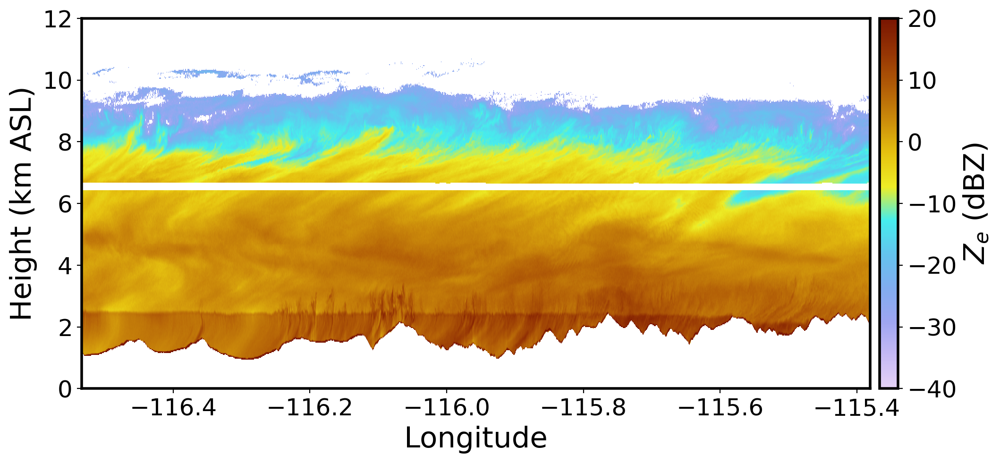

In [5]:
#Plotting reflectivity 
fig, ax = plt.subplots(1, figsize = (11, 5))

cbar = ax.pcolormesh(lon_subset, gate1d/1000, ref_subset.T, vmin = -40, vmax = 20, cmap = pyart.graph.cm.LangRainbow12)
ax.set_ylim(0, 12)
ax.tick_params(labelsize = 18)

cbar = plt.colorbar(cbar, ax = ax, pad = 0.01)
cbar.ax.tick_params(labelsize = 18)
cbar.set_label('$Z_e$ (dBZ)', fontsize = 22)

ax.set_xlabel('Longitude', fontsize = 22)
ax.set_ylabel('Height (km ASL)', fontsize = 22)

plt.tight_layout()
plt.show()

In [6]:
#This code groups radial velocity by reflectivity and then calculating the mean radial velocity for every rounded reflectivity 
#(1 dBZ) value 

df_ze_match = pd.DataFrame()

df_ze_match['Z_e'] = np.round(pd.DataFrame(ref_subset).stack(dropna = False), 0)
df_ze_match['V_r'] = pd.DataFrame(vel_subset).stack(dropna = False)

df_ze_match = df_ze_match.dropna()


groupby_df = df_ze_match.groupby(df_ze_match['Z_e']).mean()
groupby_df['Count'] = df_ze_match.groupby(df_ze_match['Z_e']).count()
groupby_df = groupby_df[groupby_df['Count'] > 500]

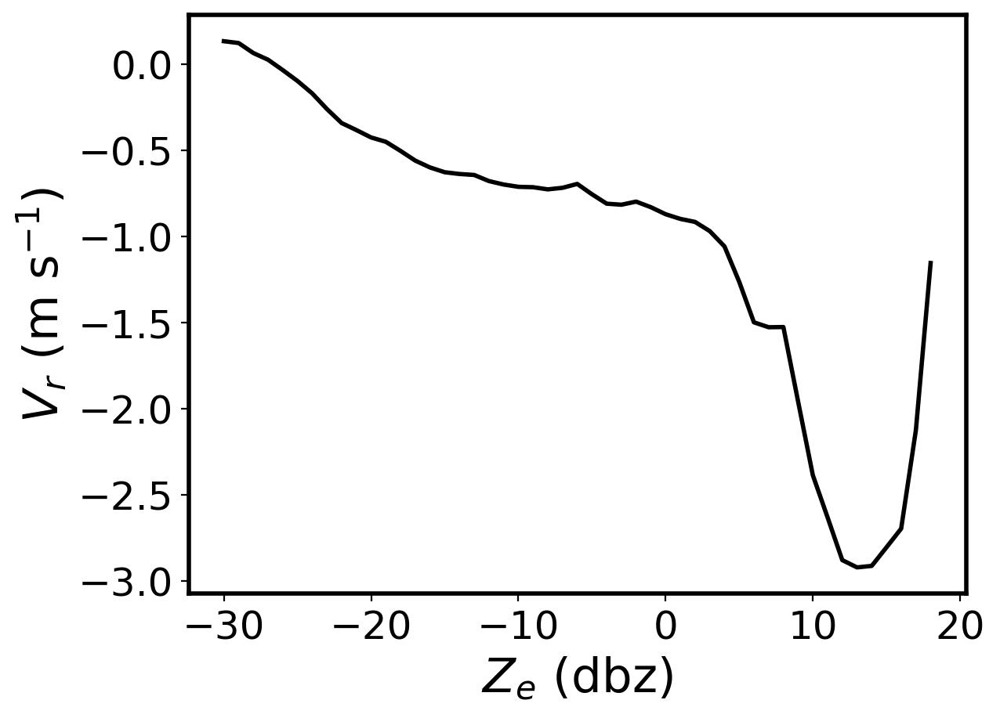

In [7]:
#Plotting the mean vertical motion as a function of reflectivity
plt.plot(groupby_df.index, groupby_df['V_r'], color = 'black', linewidth = 2)

plt.xlabel('$Z_e$ (dbz)', fontsize = 22)
plt.ylabel('$V_r$ (m s$^{-1}$)', fontsize = 22)

plt.tick_params(labelsize = 18)
plt.show()

In [8]:
#This code is going through and creating a new array called dummy array that represents the terminal velocity 
#based on the reflectivity (and mean radial velocity for that specific founded reflectivity)

dummy_array = np.empty((ref_subset.shape[0], ref_subset.shape[1]))
dummy_array[dummy_array == 0] = np.nan

for i in range(len(groupby_df)): 
    x, y = np.where(np.round(ref_subset, 0) == groupby_df.index[i])

    dummy_array[x, y] = groupby_df['V_r'].values[i]

dummy_array = pd.DataFrame(dummy_array)
dummy_array[pd.DataFrame(ref_subset).isnull()] = np.nan

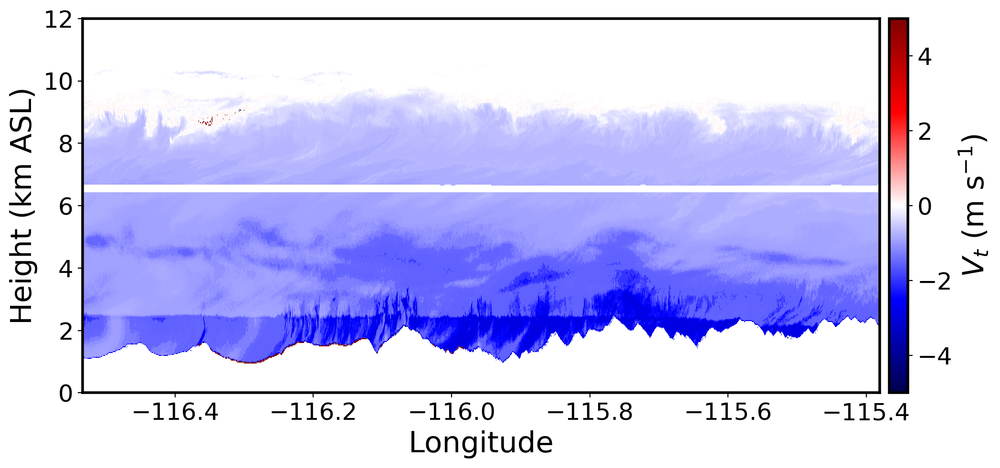

In [9]:
#Plotting terminal velocity
fig, ax = plt.subplots(1, figsize = (11, 5))

cbar = ax.pcolormesh(lon_subset, gate1d/1000, dummy_array.T.values, vmin = -5, vmax = 5, cmap = 'seismic')
ax.set_ylim(0, 12)
ax.tick_params(labelsize = 18)

cbar = plt.colorbar(cbar, ax = ax, pad = 0.01)
cbar.ax.tick_params(labelsize = 18)
cbar.set_label('$V_t$ (m s$^{-1}$)', fontsize = 22)

ax.set_xlabel('Longitude', fontsize = 22)
ax.set_ylabel('Height (km ASL)', fontsize = 22)

plt.tight_layout()
plt.show()

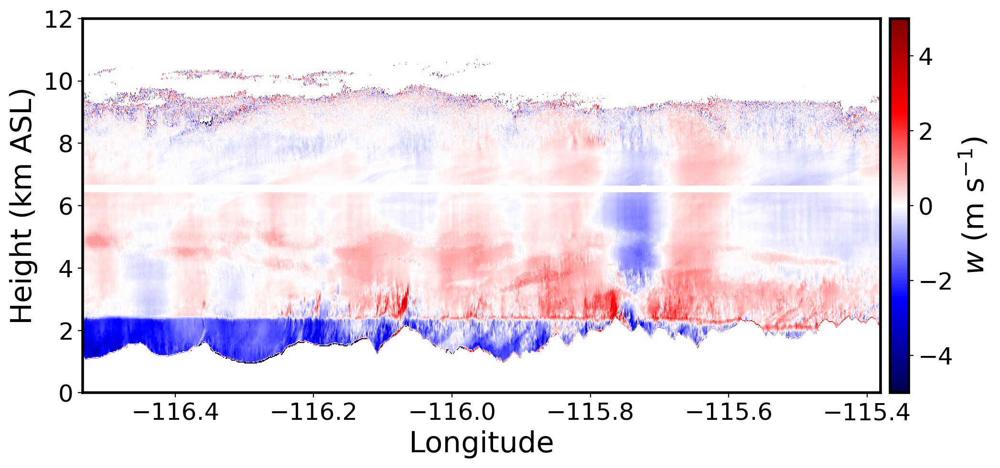

In [10]:
#We are going to subtract the terminal velocity array we created at every range gate to get an estimate of vertical motion
#This is what that profile looks like
w_ref = vel_subset - dummy_array

fig, ax = plt.subplots(1, figsize = (11, 5))

cbar = ax.pcolormesh(lon_subset, gate1d/1000, w_ref.T, vmin = -5, vmax = 5, cmap = 'seismic')
ax.set_ylim(0, 12)
ax.tick_params(labelsize = 18)

cbar = plt.colorbar(cbar, ax = ax, pad = 0.01)
cbar.ax.tick_params(labelsize = 18)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22)

ax.set_xlabel('Longitude', fontsize = 22)
ax.set_ylabel('Height (km ASL)', fontsize = 22)

plt.tight_layout()
plt.show()

A second approach involves calculating the mean value of vertical radial velocity at a given altitude with the assumption that the expected magnitude of updrafts and downdrafts are approximately equal such that mean updraft strength at a given height is 0 m/s.  The mean radial velocity value is the terminal velocity at a given height and is subtracted from all radial velocity values to get an estimate of updraft strength.

Data in this example would likely need to be regridded. The radar data provided regridded the data to a constant 30 m grid.

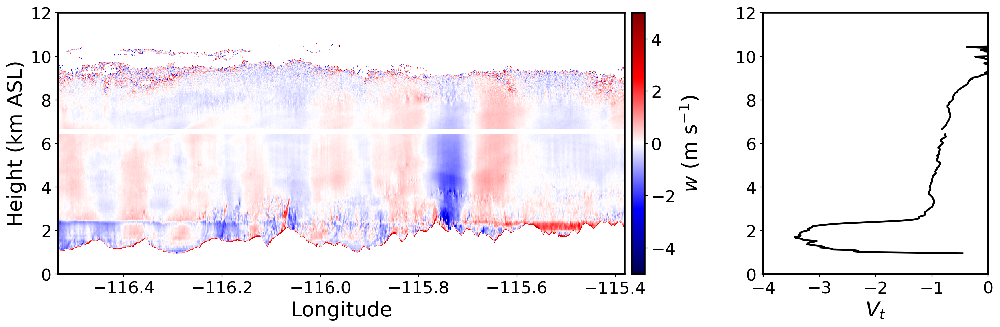

In [11]:
#This is what it would look like if we instead calculated the mean radial velocity at a given height 
#and assumed that it was the mean terminal velocity (we'll call this w), subtracting it out
w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values




fig, ax = plt.subplots(1, 2, figsize = (15, 5), gridspec_kw={'width_ratios': [3, 1]})

cbar = ax[0].pcolormesh(lon_subset, gate1d/1000, w_estimate_mean.T, vmin = -5, vmax = 5, cmap = 'seismic')
ax[0].set_ylim(0, 12)
ax[0].tick_params(labelsize = 18)

cbar = plt.colorbar(cbar, ax = ax[0], pad = 0.01)
cbar.ax.tick_params(labelsize = 18)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22)

ax[0].set_xlabel('Longitude', fontsize = 22)
ax[0].set_ylabel('Height (km ASL)', fontsize = 22)


ax[1].plot(pd.DataFrame(vel_subset).mean(axis = 0).values, gate1d/1000, color = 'black', linewidth = 2)
ax[1].set_ylim(0, 12)
ax[1].tick_params(labelsize = 18)

ax[1].set_xlim(-4, 0)

ax[1].set_xlabel('$V_t$', fontsize = 22)

plt.tight_layout()
plt.show()

A third approach, applicable to unrimed snow would be to simple assume a contant value of terminal velocity since the reflectivity-weighted terminal velocity of unrimed ice particles is often between 0.5-1.2 m/s over much of the cloud depth in an ice environment.

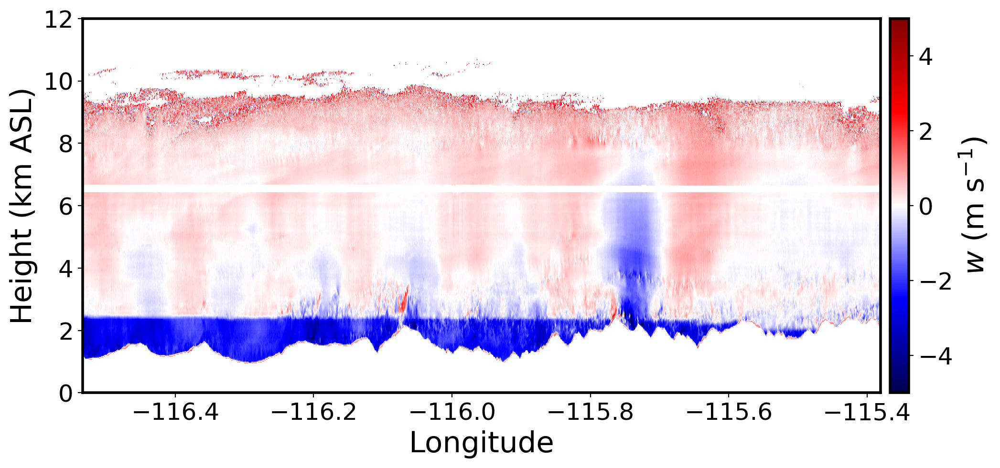

In [12]:
#In this case we are assuming that the mean terminal fall velocity of an unrimed ice crystal is 1 m/s
#large biases still exist for this flight leg
w_estimate_constant = vel_subset - -1


fig, ax = plt.subplots(1, figsize = (11, 5))

cbar = ax.pcolormesh(lon_subset, gate1d/1000, w_estimate_constant.T, vmin = -5, vmax = 5, cmap = 'seismic')
ax.set_ylim(0, 12)
ax.tick_params(labelsize = 18)

cbar = plt.colorbar(cbar, ax = ax, pad = 0.01)
cbar.ax.tick_params(labelsize = 18)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22)

ax.set_xlabel('Longitude', fontsize = 22)
ax.set_ylabel('Height (km ASL)', fontsize = 22)

plt.tight_layout()
plt.show()

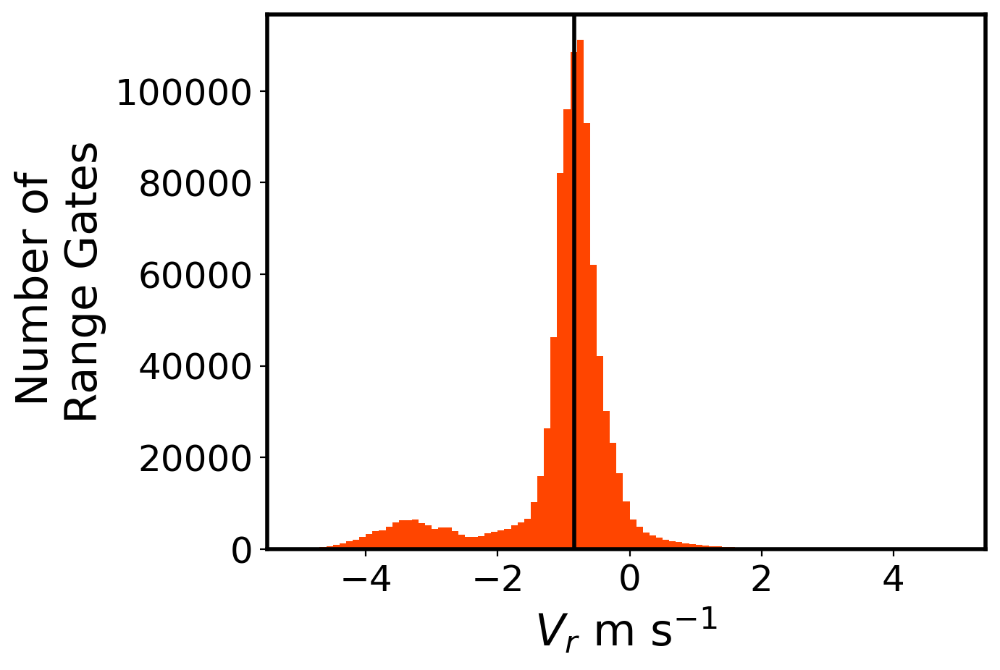

The median radial velocity value is -0.84


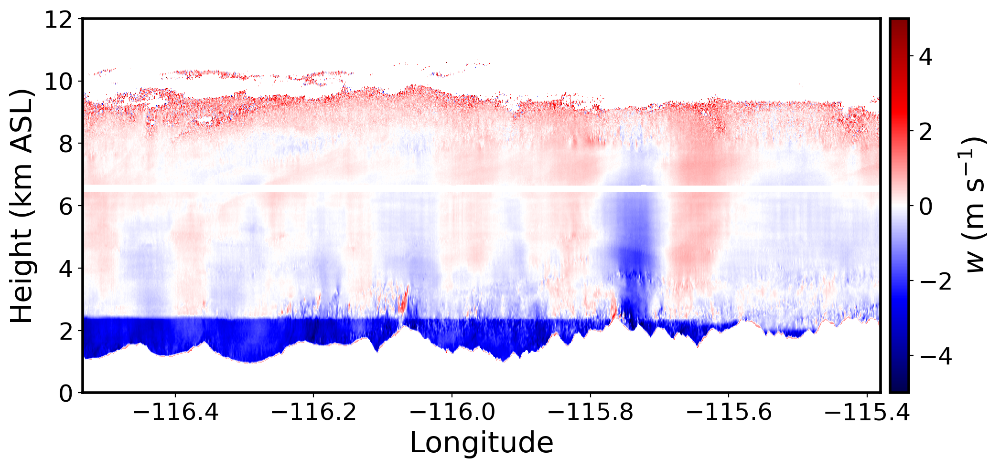

In [13]:
#Doing this a little more scientifically... and making a pandas data frame with all of the 
#radial velocities recorded and estimating what the mean radial velocity would be using data from every range gate

plt.hist(pd.DataFrame(vel_subset).stack(), bins = np.arange(-5, 5, 0.1), color = 'orangered')

plt.tick_params(labelsize = 18) 

plt.ylabel('Number of \nRange Gates', fontsize = 22)
plt.xlabel('$V_r$ m s$^{-1}$', fontsize = 22)

plt.axvline(pd.DataFrame(vel_subset).stack().median(), color = 'black', linewidth = 2)
plt.show()

print('The median radial velocity value is ' + str(np.round(pd.DataFrame(vel_subset).stack().median(), 2)))


w_estimate_constant = vel_subset - pd.DataFrame(vel_subset).stack().median()


fig, ax = plt.subplots(1, figsize = (11, 5))

cbar = ax.pcolormesh(lon_subset, gate1d/1000, w_estimate_constant.T, vmin = -5, vmax = 5, cmap = 'seismic')
ax.set_ylim(0, 12)
ax.tick_params(labelsize = 18)

cbar = plt.colorbar(cbar, ax = ax, pad = 0.01)
cbar.ax.tick_params(labelsize = 18)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22)

ax.set_xlabel('Longitude', fontsize = 22)
ax.set_ylabel('Height (km ASL)', fontsize = 22)

plt.tight_layout()
plt.show()

# How do we quantify vertical motion?


We can quantify vertical motions as a function of height using contoured frequency by altitude diagrams or CFADs. Bascially at a given height/or range of heights you quantify the number of updrafts within a given range (0.1 m/s or 0.25 m/s range).  This allows you to easily see what updraft magnitudes you have at a given height. 

CFAD code below uses increments of 0.1 m/s and  altitude increments of  100 m.  This code is meant to work on a regridded dataset.  

In [14]:
#These are functions to calculate CFADs using the radial velocity and reflectivity data. 
#It will bin radial velocity every 0.1 m/s between -10 and 10 at every given height. 
#It groups the range every 50 m and then calculates the frequency in a given radial velocity bin at a given height
#It returns the bins, height, and then CFAD 
#It also calculates quantiles at a given height of radial velocity allowing you to plot those at well if you return them.
def CFAD_vel(vel_input): 
    velo = pd.DataFrame()
    vel_bins = np.arange(-10, 10, .1)

    for k in range(vel_input.shape[1]):
        hist = np.histogram(vel_input[:, k], vel_bins, range=(-6, 6))[0] 
        hist = pd.DataFrame(hist) 
        hist = hist.T
        velo = pd.concat([velo, hist]) 

    velo.columns = np.arange(-10, 10, .1)[:-1] 

    velo.index = pd.DataFrame(gate1d).values[:, 0]

    velo = velo.groupby(velo.index // 50 * 50).sum() 
    summation_of_values = velo
    velo = velo.loc[:,velo.select_dtypes(exclude='object').columns]=velo.select_dtypes(exclude='object').div(velo.select_dtypes(exclude='object').sum(1),0)*100
    velo = velo[velo>0]
    velo = velo.astype(np.float64)

    quantile_10 = []
    quantile_25 = []
    quantile_50 = []
    quantile_75 = []
    quantile_90 = []

    for n in range(velo.shape[0]):
        values = velo.cumsum(axis = 1).loc[velo.index[n], :].values

        def find_nearest(array, value):
            array = np.asarray(array)
            idx = (np.abs(array - value)).argmin()
            return idx

        nearest_10 = find_nearest(np.nan_to_num(values, 0), 10)
        nearest_25 = find_nearest(np.nan_to_num(values, 0), 25)
        nearest_50 = find_nearest(np.nan_to_num(values, 0), 50)
        nearest_75 = find_nearest(np.nan_to_num(values, 0), 75)
        nearest_90 = find_nearest(np.nan_to_num(values, 0), 90)

        quantile_10.append(velo.columns[nearest_10])
        quantile_25.append(velo.columns[nearest_25])
        quantile_50.append(velo.columns[nearest_50])
        quantile_75.append(velo.columns[nearest_75])
        quantile_90.append(velo.columns[nearest_90])

    quantile_10 = np.array(quantile_10).astype(np.float64)
    quantile_10[quantile_10 < -9.] = np.nan

    quantile_25 = np.array(quantile_25).astype(np.float64)
    quantile_25[quantile_25 < -9.] = np.nan

    quantile_50 = np.array(quantile_50).astype(np.float64)
    quantile_50[quantile_50 < -9.] = np.nan

    quantile_75 = np.array(quantile_75).astype(np.float64)
    quantile_75[quantile_75 < -9.] = np.nan

    quantile_90 = np.array(quantile_90).astype(np.float64)
    quantile_90[quantile_90 < -9.] = np.nan
    
    return velo.columns, velo.index/1000, velo



def CFAD_ref(ref_input): 
    ref = pd.DataFrame()
    ref_bins = np.arange(-50, 20, 1)

    for i in range(ref_input.shape[1]):
        hist = np.histogram(ref_input[:, i], ref_bins, range=(-40, 20))[0] 
        hist = pd.DataFrame(hist) 
        hist = hist.T
        ref = pd.concat([ref, hist])


    ref.columns = np.arange(-50, 20, 1)[:-1] 

    ref.index = pd.DataFrame(gate1d).values[:, 0]


    ref = ref.groupby(ref.index // 50 * 50).sum() 
    ref.index = ref.index 

    ref = ref.loc[:,ref.select_dtypes(exclude='object').columns]=ref.select_dtypes(exclude='object').div(ref.select_dtypes(exclude='object').sum(1),0)*100
    ref = ref[ref>0]
    ref = ref.astype(np.float64)


    quantile_10 = []
    quantile_25 = []
    quantile_50 = []
    quantile_75 = []
    quantile_90 = []


    for i in range(ref.shape[0]):
        values = ref.cumsum(axis = 1).loc[ref.index[i], :].values

        def find_nearest(array, value):
            array = np.asarray(array)
            idx = (np.abs(array - value)).argmin()
            return idx

        nearest_10 = find_nearest(np.nan_to_num(values, 0), 10)
        nearest_25 = find_nearest(np.nan_to_num(values, 0), 25)
        nearest_50 = find_nearest(np.nan_to_num(values, 0), 50)
        nearest_75 = find_nearest(np.nan_to_num(values, 0), 75)
        nearest_90 = find_nearest(np.nan_to_num(values, 0), 90)

        quantile_10.append(ref.columns[nearest_10])
        quantile_25.append(ref.columns[nearest_25])
        quantile_50.append(ref.columns[nearest_50])
        quantile_75.append(ref.columns[nearest_75])
        quantile_90.append(ref.columns[nearest_90])

    quantile_10 = np.array(quantile_10).astype(np.float64)
    quantile_10[quantile_10 < -49.] = np.nan

    quantile_25 = np.array(quantile_25).astype(np.float64)
    quantile_25[quantile_25 < -49.] = np.nan

    quantile_50 = np.array(quantile_50).astype(np.float64)
    quantile_50[quantile_50 < -49.] = np.nan

    quantile_75 = np.array(quantile_75).astype(np.float64)
    quantile_75[quantile_75 < -49.] = np.nan

    quantile_90 = np.array(quantile_90).astype(np.float64)
    quantile_90[quantile_90 < -49.] = np.nan
    
    return ref.columns, ref.index/1000, ref

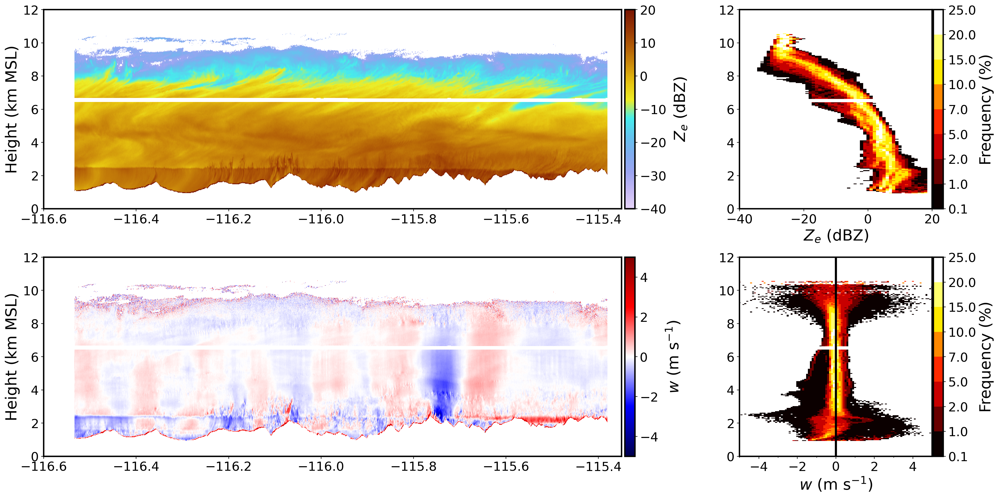

In [15]:
#Calling the functions above and creating CFADs for reflectivity and radial velocity. 

fig, axs = plt.subplots(2, 2, figsize = (20, 10), gridspec_kw={'width_ratios': [3, 1]})

cm = axs[0, 0].pcolormesh(lon_subset, gate1d/1000, ref_subset.T, vmin = -40, vmax = 20, cmap = pyart.graph.cm.LangRainbow12)

axs[0, 0].set_xlim(-116.6, -115.35)
axs[0, 0].set_ylim(0, 12)

axs[0, 0].set_ylabel('Height (km MSL)', fontsize = 22)

axs[0, 0].tick_params(labelsize = 18)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs[0, 0])
cbar.set_label('$Z_e$ (dBZ)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)




cmap = plt.get_cmap('hot')
fraction_levels = [.1, 1, 2, 5, 7, 10, 15, 20, 25]
norm = BoundaryNorm(fraction_levels, ncolors=cmap.N)

x_ref_cfad, y_ref_cfad, ref_cfad = CFAD_ref(ref_subset)
pm = axs[0, 1].pcolormesh(x_ref_cfad, y_ref_cfad, ref_cfad, cmap = cmap, norm=norm, rasterized = True)
axs[0, 1].set_ylim(0, 12)
axs[0, 1].tick_params(which='both',labelsize=18)
axs[0, 1].set_xlabel('$Z_e$ (dBZ)', fontsize = 22)

axs[0, 1].set_xticks(np.arange(40, 20, 5), minor = True)

cbar = fig.colorbar(pm, label = 'm s$^{-1}$)', ax=axs[0, 1], pad=0.005)
cbar.ax.tick_params(labelsize=18) 
cbar.set_label(label='Frequency (%)',fontsize= 22)


axs[0, 1].set_xlim(-40, 20)




cm = axs[1, 0].pcolormesh(lon_subset, gate1d/1000, w_estimate_mean.T, vmin = -5, vmax = 5, cmap = 'seismic')

axs[1, 0].set_xlim(-116.6, -115.35)
axs[1, 0].set_ylim(0, 12)

axs[1, 0].set_ylabel('Height (km MSL)', fontsize = 22)

axs[1, 0].tick_params(labelsize = 18)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs[1, 0])
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)



cmap = plt.get_cmap('hot')
fraction_levels = [.1, 1, 2, 5, 7, 10, 15, 20, 25]
norm = BoundaryNorm(fraction_levels, ncolors=cmap.N)

x_vel_cfad, y_vel_cfad, vel_cfad = CFAD_vel(w_estimate_mean)
pm = axs[1, 1].pcolormesh(x_vel_cfad, y_vel_cfad, vel_cfad, cmap = cmap, norm=norm, rasterized = True)
axs[1, 1].set_ylim(0, 12)
axs[1, 1].tick_params(which='both',labelsize=18)
axs[1, 1].set_xlabel('$w$ (m s$^{-1}$)', fontsize = 22)
axs[1, 1].axvline(x=0, color = 'black', linewidth = 3)

axs[1, 1].set_xticks(np.arange(-5, 5, 1), minor = True)

cbar = fig.colorbar(pm, label = 'm s$^{-1}$)', ax=axs[1, 1], pad=0.005)
cbar.ax.tick_params(labelsize=18) 
cbar.set_label(label='Frequency (%)',fontsize= 22)


axs[1, 1].set_xlim(-5, 5)

plt.tight_layout()
plt.show()

# Types of updrafts over complex topography

Updrafts in wintertime cloud systems over mountainous regions are both fixed, mechanically driven by the terrain under a given ambient wind and stability profile (i.e., vertically propagating gravity waves), and transient, related to vertical wind shear and conditional instability within passing weather systems. These fixed vertical circulations comprised a background circulation in which transient circulations were embedded. Transient vertical circulations are shown to be associated with transient wave motions, cloud top generating cells, convection, and turbulence.

- Fixed Orographic Waves

    Quasi-stationary orographically-induced gravity waves result from winds blowing across a mountain range causing forced ascent on the windward side and forced descent on the leeward side. The behavior of these vertically propagating waves in response to ambient stability and wind profiles have been studied extensively, mainly through numerical simulations with idealized terrain and idealized soundings. Cross-mountain distributions of forced ascent/descent are dependent on terrain geometry such as the height, width, and length of a given mountain range. In general, the quasi-stationary updraft and downdraft intensity varies proportionally with the strength of the mean low-level winds.  

    Most mountain ranges on Earth exhibit complex terrain profiles, with 2D terrain width, heights, and length “felt” by the wind depending on the prevailing wind direction. Wave behavior is different for different individual ridges, and the mesoscale flow over these ridges is impacted by the entire mountain range. To a first order, in an unsheared environment, a mountain ridge will produce a vertically-propagating gravity wave if the advective time scale exceeds the time scale of buoyancy oscillations. That is, the mountain width must exceed U/N, where U is the ridge-normal wind speed, and N the Brunt-Väisälä frequency. Under strong winds and weak (moist) stratification, as is common when frontal disturbances cross a mountain range, only the larger ridges produce a wave response. Smaller ridges produce “evanescent” waves, i.e. a shallow dipole of rising/sinking flow on the upstream/lee side of the ridge.
    
 
- Transient Updrafts

    Although orographically-forced updrafts are commonly present, the nature of the updrafts can be modified by a variety of transient processes, the main one being convection. The focus here is on cold-season storms. While these orographic clouds primarily are stratiform, they often contain shallow to deep embedded convection, generally the result of the release of potential instability by orographic lifting. Other, typically smaller-scale transient updrafts can be associated with cloud-top generating cells, with shear-induced Kelvin-Helmholtz billows and associated turbulence, or with boundary layer turbulence.
    
    
Quantifying the properties and magnitudes of fixed and transient updraft structures within orographic clouds is a crucial step towards understanding where and when supercooled water 

See: https://doi.org/10.1175/JAMC-D-21-0229.1


We also compared radar retrieved measurements with what was measured by a gust probe at flight level. The gust probe measures u,v, and w at flight level and provided the only true comparison of vertical motions along the flight track during SNOWIE. Here is an example from research flight 23. 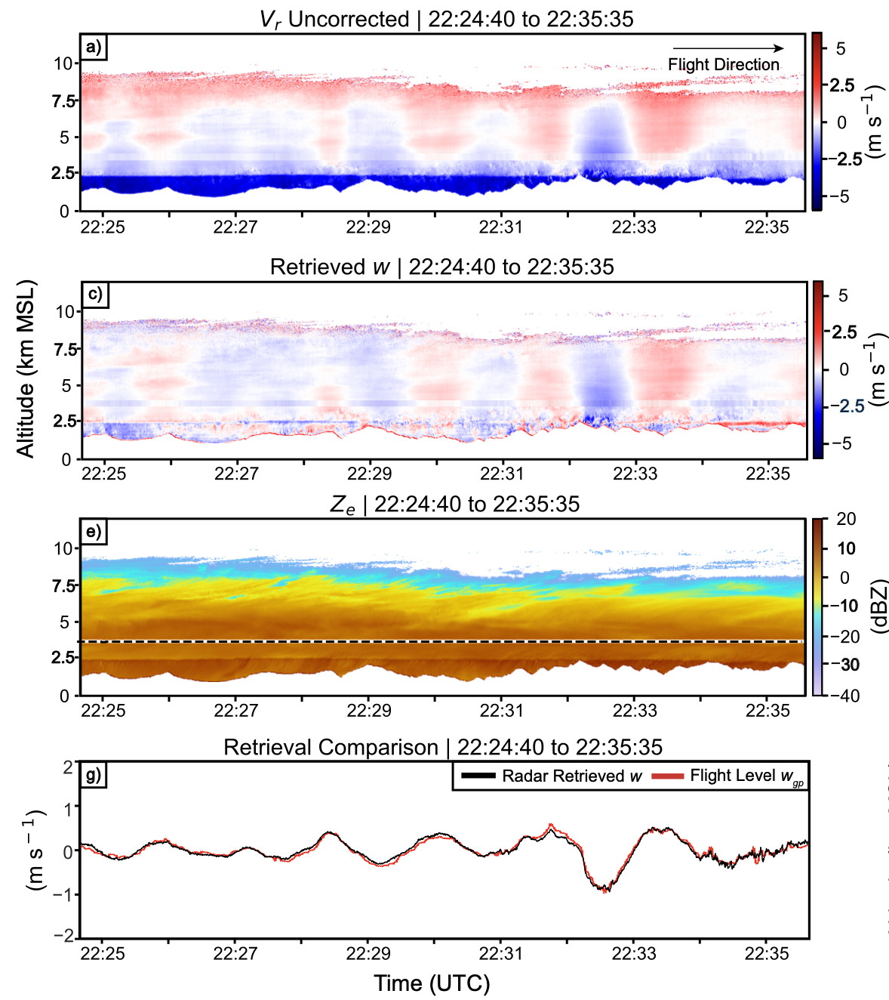

# Quantifying Fixed Updrafts

Composites of vertical motion (w) from many flight legs to be constructed along fixed tracks over the terrain. Because transient circulations vary in time and space, averaging the vertical motion fields over a large number of flight legs has the effect of removing transient updrafts while retaining fixed vertical circulations. In this section, we present composite radar-retrieved 
w for a large number of flight legs using all available data from SNOWIE to determine the average magnitude of ascent/descent forced by fixed orographic circulations.

In [16]:
#This is helper code that is going to loop through the different research flights that were flown along the 
#same flight trac and then concatenate the regridded flight legs to a list called all_velocities or all_reflectivities
#It regrids the data every 0.0025 degrees longitude and takes the median at a given height of any range gates in a given 0.0025 degree
#range.

#We need every flight leg regridded so we can create a composite.

all_velocities = []
all_reflectivities = []
rf_all = []

#All Research Flights
#rf_list = ['RF01', 'RF02', 'RF03', 'RF04', 'RF05', 'RF06', 'RF07', 'RF08', 'RF09', 'RF10', 'RF11', 'RF12', 'RF13', 'RF14', 'RF15', 'RF16', 'RF17', 'RF19', 'RF20', 'RF21', 'RF22', 'RF23', 'RF24']

#SW-NE Research Flight Legs
#rf_list = ['RF02', 'RF04', 'RF08', 'RF10', 'RF13', 'RF15', 'RF16', 'RF17', 'RF19', 'RF20']

#EW Research Flight Legs
rf_list = ['RF01', 'RF03', 'RF09', 'RF11', 'RF12', 'RF21', 'RF22', 'RF23']

for k in range(len(rf_list)): 
    rf = rf_list[k]
    
    #Here are most of the flight legs flown during SNOWIE determined using the roll and lat/lon
    if rf == 'RF01':
        iop_t =  [
                  ['2017-01-08 02:46:30', '2017-01-08 02:56:10', '1', 0],
                  ['2017-01-08 03:00:10', '2017-01-08 03:16:10', '2', 1],
                  ['2017-01-08 03:20:25', '2017-01-08 03:27:30', '3', 0],
                  ['2017-01-08 03:31:30', '2017-01-08 03:51:00', '4', 1],
                  ['2017-01-08 03:54:15', '2017-01-08 04:05:10', '5', 0],
                  ['2017-01-08 04:08:00', '2017-01-08 04:29:00', '6', 1],
                  ['2017-01-08 04:32:00', '2017-01-08 04:43:00', '7', 0],
                  ['2017-01-08 04:46:00', '2017-01-08 05:06:50', '8', 1],
                  ['2017-01-08 05:10:00', '2017-01-08 05:21:00', '9', 0],
                  ['2017-01-08 05:24:30', '2017-01-08 05:40:10', '10', 1]]

    if rf == 'RF02':
        iop_t = [['2017-01-09 04:35:30', '2017-01-09 04:46:00', '1', 0],
                 ['2017-01-09 04:50:20', '2017-01-09 05:06:10', '2', 1],
                 ['2017-01-09 05:09:30', '2017-01-09 05:17:25', '3', 0],
                 ['2017-01-09 05:21:20', '2017-01-09 05:38:00', '4', 1],
                 ['2017-01-09 05:42:00', '2017-01-09 05:50:20', '5', 0],
                 ['2017-01-09 05:54:30', '2017-01-09 06:13:50', '6', 1],
                 ['2017-01-09 06:17:10', '2017-01-09 06:28:00', '7', 0],
                 ['2017-01-09 06:32:00', '2017-01-09 06:50:20', '8', 1],
                 ['2017-01-09 06:55:00', '2017-01-09 07:04:50', '9',0],
                 ['2017-01-09 07:09:00', '2017-01-09 07:26:30','10',1]]

    if rf == 'RF03':
        iop_t = [['2017-01-11 02:47:30', '2017-01-11 03:03:40', '1', 0],
                 ['2017-01-11 03:07:00', '2017-01-11 03:24:10', '2', 1],
                 ['2017-01-11 03:27:30', '2017-01-11 03:34:10', '3', 0],
                 ['2017-01-11 03:37:30', '2017-01-11 03:51:40', '4', 1],
                 ['2017-01-11 03:55:00', '2017-01-11 04:02:45', '5', 0],
                 ['2017-01-11 04:06:10', '2017-01-11 04:21:00', '6', 1],
                 ['2017-01-11 04:24:30', '2017-01-11 04:35:30', '7', 0],
                 ['2017-01-11 04:39:00', '2017-01-11 04:58:20', '8', 1],
                 ['2017-01-11 05:01:30', '2017-01-11 05:12:50', '9', 0],
                 ['2017-01-11 05:17:00', '2017-01-11 05:28:10','10', 1]]

    if rf == 'RF04':
        iop_t = [['2017-01-18 20:17:00', '2017-01-18 20:31:10', '1', 0],
                 ['2017-01-18 20:34:30', '2017-01-18 20:50:10', '2', 1],
                 ['2017-01-18 20:55:00', '2017-01-18 21:05:00', '3', 0],
                 ['2017-01-18 21:07:40', '2017-01-18 21:24:30', '4', 1],
                 ['2017-01-18 21:28:30', '2017-01-18 21:38:10', '5', 0],
                 ['2017-01-18 21:41:30', '2017-01-18 21:57:30', '6', 1],
                 ['2017-01-18 22:02:00', '2017-01-18 22:11:40', '7', 0],
                 ['2017-01-18 22:14:40', '2017-01-18 22:30:30', '8', 1],
                 ['2017-01-18 22:33:30', '2017-01-18 22:43:35', '9', 0],
                 ['2017-01-18 22:46:25', '2017-01-18 23:51:30','10', 1]]

    if rf == 'RF05':
        iop_t =[['2017-01-19 15:41:30', '2017-01-19 15:59:10', '1', 0],
                ['2017-01-19 16:03:00', '2017-01-19 16:19:50', '2', 1],
                ['2017-01-19 16:23:00', '2017-01-19 16:36:20', '3', 0],
                ['2017-01-19 16:40:20', '2017-01-19 16:53:40', '4', 1],
                ['2017-01-19 16:56:40', '2017-01-19 17:07:40', '5', 0],
                ['2017-01-19 17:10:30', '2017-01-19 17:23:00', '6', 1],
                ['2017-01-19 17:25:30', '2017-01-19 17:34:40', '7', 0],
                ['2017-01-19 17:38:00', '2017-01-19 17:49:35', '8', 1],
                ['2017-01-19 17:52:10', '2017-01-19 18:01:05', '9', 0],
                ['2017-01-19 18:04:00', '2017-01-19 18:21:50', '10', 1]]

    if rf == 'RF06':
        iop_t =[['2017-01-19 22:45:30', '2017-01-19 23:05:00', '1', 0],
                ['2017-01-19 23:08:06', '2017-01-19 23:25:10', '2', 1],
                ['2017-01-19 23:29:30', '2017-01-19 23:43:05', '3', 0],
                ['2017-01-19 23:46:30', '2017-01-20 00:02:30', '4', 1],
                ['2017-01-20 00:07:00', '2017-01-20 00:19:40', '5', 0],
                ['2017-01-20 00:23:00', '2017-01-20 00:39:00', '6', 1],
                ['2017-01-20 00:42:40', '2017-01-20 00:56:50', '7', 0],
                ['2017-01-20 01:00:00', '2017-01-20 01:17:20', '8', 1],
                ['2017-01-20 01:22:00', '2017-01-20 01:35:55', '9', 0],
                ['2017-01-20 01:39:00', '2017-01-20 01:52:00', '10', 1]]

    if rf == 'RF07':
        iop_t =[['2017-01-21 22:49:40', '2017-01-21 22:57:40', '1', 0],
                ['2017-01-21 23:00:40', '2017-01-21 23:10:25', '2', 1],
                ['2017-01-21 23:13:30', '2017-01-21 23:20:40', '3', 0],
                ['2017-01-21 23:33:30', '2017-01-21 23:41:30', '4', 1],
                ['2017-01-21 23:45:00', '2017-01-21 23:52:00', '5', 0],
                ['2017-01-21 23:55:30', '2017-01-22 00:03:55', '6', 1],
                ['2017-01-22 00:07:00', '2017-01-22 00:14:20', '7', 0],
                ['2017-01-22 00:17:30', '2017-01-22 00:25:40', '8', 1],
                ['2017-01-22 00:28:20', '2017-01-22 00:36:40', '9', 0],
                ['2017-01-22 00:40:00', '2017-01-22 00:48:20', '10', 1],
                ['2017-01-22 00:51:25', '2017-01-22 00:59:35', '11', 0],
                ['2017-01-22 01:02:40', '2017-01-22 01:10:35', '12', 1],
                ['2017-01-22 01:16:00', '2017-01-22 01:28:50', '13', 1]]

    if rf == 'RF08':
        iop_t =[['2017-01-22 21:18:00', '2017-01-22 21:23:00', '1', 0],
                ['2017-01-22 21:26:00', '2017-01-22 21:40:55', '2', 1],
                ['2017-01-22 21:43:40', '2017-01-22 21:50:50', '3', 0],
                ['2017-01-22 21:53:30', '2017-01-22 22:05:35', '4', 1],
                ['2017-01-22 22:08:00', '2017-01-22 22:16:35', '5', 0],
                ['2017-01-22 22:21:00', '2017-01-22 22:38:05', '6', 1],
                #['2017-01-22 22:40:40', '2017-01-22 22:52:20', '7', 0],
                #['2017-01-22 22:55:10', '2017-01-22 23:12:30', '8', 1],
                ['2017-01-22 23:15:50', '2017-01-22 23:26:30', '9', 0],
                ['2017-01-22 23:29:30', '2017-01-22 23:46:10','10', 1],
                ['2017-01-22 23:50:00', '2017-01-23 00:00:30','11', 0],
                ['2017-01-23 00:03:30', '2017-01-23 00:20:00','12', 1]]

    if rf == 'RF09':
        iop_t =[['2017-01-31 20:21:00', '2017-01-31 20:31:00', '1', 0],
                ['2017-01-31 20:35:00', '2017-01-31 20:52:30', '2', 1],
                ['2017-01-31 21:01:20', '2017-01-31 21:06:00', '3', 0],
                ['2017-01-31 21:08:50', '2017-01-31 21:12:40', '4', 1],
                ['2017-01-31 21:16:00', '2017-01-31 21:20:00', '5', 0],
                ['2017-01-31 21:22:20', '2017-01-31 21:28:30', '6', 1],
                ['2017-01-31 21:31:30', '2017-01-31 21:38:40', '7', 0], 
                ['2017-01-31 21:48:00', '2017-01-31 22:01:10', '8', 1]]

    if rf == 'RF10':
        iop_t = [['2017-02-03 20:06:25', '2017-02-03 20:17:40', '1', 0],
                 ['2017-02-03 20:20:40', '2017-02-03 20:38:00', '2', 1],
                 ['2017-02-03 20:40:30', '2017-02-03 20:50:05', '3', 0],
                 ['2017-02-03 20:53:00', '2017-02-03 21:03:50', '4', 1],
                 ['2017-02-03 21:06:10', '2017-02-03 21:13:20', '5', 0],
                 ['2017-02-03 21:16:40', '2017-02-03 21:24:50', '6', 1]]

    if rf == 'RF11':
        iop_t =[['2017-02-04 22:09:00', '2017-02-04 22:17:55', '1', 0],
                ['2017-02-04 22:21:30', '2017-02-04 22:38:40', '2', 1],
                ['2017-02-04 22:42:30', '2017-02-04 22:50:40', '3', 0],
                ['2017-02-04 22:56:00', '2017-02-04 23:11:30', '4', 1],
                ['2017-02-04 23:15:00', '2017-02-04 23:27:00', '5', 0],
                ['2017-02-04 23:29:40', '2017-02-04 23:43:00', '6', 1],
                ['2017-02-04 23:46:30', '2017-02-04 23:56:30', '7', 0],
                ['2017-02-05 00:00:00', '2017-02-05 00:12:20', '8', 1],
                ['2017-02-05 00:15:30', '2017-02-05 00:25:40', '9', 0],
                ['2017-02-05 00:28:10', '2017-02-05 00:42:20', '10', 1],
                ['2017-02-05 00:45:30', '2017-02-05 00:56:10', '11', 0],
                ['2017-02-05 00:59:40', '2017-02-05 01:07:10', '12', 1]]

    if rf == 'RF12':
        iop_t =[
                ['2017-02-07 20:13:40', '2017-02-07 20:23:35', '1', 0],
                ['2017-02-07 20:26:30', '2017-02-07 20:46:05', '2', 1],
                ['2017-02-07 20:50:00', '2017-02-07 20:59:30', '3', 0],
                ['2017-02-07 21:02:40', '2017-02-07 21:22:25', '4', 1],
                ['2017-02-07 21:25:10', '2017-02-07 21:35:00', '5', 0],
                ['2017-02-07 21:37:10', '2017-02-07 21:56:50', '6', 1],
                ['2017-02-07 21:59:40', '2017-02-07 22:09:35', '7', 0],
                ['2017-02-07 22:12:50', '2017-02-07 22:33:50', '8', 1],
                ['2017-02-07 22:37:00', '2017-02-07 22:46:10', '9', 0],
                ['2017-02-07 22:49:00', '2017-02-07 23:03:00','10', 1]]

    if rf == 'RF13':
        iop_t = [['2017-02-16 23:43:00', '2017-02-16 23:52:30', '1', 0],
                 ['2017-02-16 23:58:10', '2017-02-17 00:12:15', '2', 1],
                 ['2017-02-17 00:20:30', '2017-02-17 00:25:40', '3', 0],
                 ['2017-02-17 00:30:00', '2017-02-17 00:41:30', '4', 1]]

    if rf == 'RF14':
        iop_t = [['2017-02-18 21:39:40', '2017-02-18 21:58:00', '1', 0],
                 ['2017-02-18 22:03:00', '2017-02-18 22:21:40', '2', 1],
                 ['2017-02-18 22:25:15', '2017-02-18 22:37:30', '3', 0],
                 ['2017-02-18 22:39:40', '2017-02-18 22:58:05', '4', 1],
                 ['2017-02-18 23:01:00', '2017-02-18 23:14:30', '5', 0],
                 ['2017-02-18 23:16:50', '2017-02-18 23:34:40', '6', 1],
                 ['2017-02-18 23:36:50', '2017-02-18 23:50:40', '7', 0],
                 ['2017-02-18 23:52:30', '2017-02-19 00:06:55', '8', 1],
                 ['2017-02-19 00:10:30', '2017-02-19 00:19:50', '9', 0],
                 ['2017-02-19 00:21:00', '2017-02-19 00:41:10', '10', 1]]

    if rf == 'RF15':
        iop_t = [['2017-02-19 17:44:30', '2017-02-19 17:55:10', '1', 0],
                 ['2017-02-19 17:59:00', '2017-02-19 18:15:10', '2', 1],
                 ['2017-02-19 18:18:20', '2017-02-19 18:30:50', '3', 0],
                 ['2017-02-19 18:34:30', '2017-02-19 18:46:10', '4', 1],
                 ['2017-02-19 18:50:10', '2017-02-19 18:58:30', '5', 0],
                 ['2017-02-19 19:02:40', '2017-02-19 19:09:50', '6', 1],
                 ['2017-02-19 19:13:35', '2017-02-19 19:18:55', '7', 0],
                 ['2017-02-19 19:22:30', '2017-02-19 19:39:10', '8', 1],
                 ['2017-02-19 19:42:30', '2017-02-19 19:57:30', '9', 0],
                 ['2017-02-19 20:01:00', '2017-02-19 20:14:30', '10', 1],
                 ['2017-02-19 20:18:00', '2017-02-19 20:26:50', '11', 0],
                 ['2017-02-19 20:30:10', '2017-02-19 20:45:50', '12', 1]]

    if rf == 'RF16':
        iop_t =[['2017-02-20 14:47:30', '2017-02-20 14:57:20', '1', 0],
                ['2017-02-20 15:01:10', '2017-02-20 15:20:55', '2', 1],
                ['2017-02-20 15:24:40', '2017-02-20 15:35:40', '3', 0],
                ['2017-02-20 15:39:00', '2017-02-20 15:58:40', '4', 1],
                ['2017-02-20 16:02:20', '2017-02-20 16:12:30', '5', 0],
                ['2017-02-20 16:17:50', '2017-02-20 16:37:40', '6', 1],
                ['2017-02-20 16:41:00', '2017-02-20 16:48:30', '7', 0],
                ['2017-02-20 17:05:50', '2017-02-20 17:21:00', '8', 1]]

    if rf == 'RF17':
        iop_t =[#['2017-02-21 14:42:40', '2017-02-21 14:52:20', '1', 0],
                #['2017-02-21 14:56:00', '2017-02-21 15:15:50', '2', 1],
                #['2017-02-21 15:19:50', '2017-02-21 15:30:30', '3', 0],
                #['2017-02-21 15:35:10', '2017-02-21 15:53:20', '4', 1],
                ['2017-02-21 16:18:00', '2017-02-21 16:31:05', '5', 0],
                ['2017-02-21 16:35:50', '2017-02-21 16:52:40', '6', 1],
                ['2017-02-21 16:55:50', '2017-02-21 17:06:20', '7', 0],
                ['2017-02-21 17:11:10', '2017-02-21 17:30:10', '8', 1],
                ['2017-02-21 17:34:10', '2017-02-21 17:44:10', '9', 0],
                ['2017-02-21 17:48:20', '2017-02-21 18:06:50','10', 1]]

    if rf == 'RF19':
        iop_t =[['2017-03-04 13:29:25', '2017-03-04 13:39:50', '1', 0],
                ['2017-03-04 13:43:50', '2017-03-04 14:00:10', '2', 1],
                ['2017-03-04 14:03:35', '2017-03-04 14:15:10', '3', 0],
                ['2017-03-04 14:18:50', '2017-03-04 14:33:40', '4', 1],
                ['2017-03-04 14:36:50', '2017-03-04 14:48:35', '5', 0],
                ['2017-03-04 14:51:50', '2017-03-04 15:01:50', '6', 1],
                ['2017-03-04 15:04:40', '2017-03-04 15:12:40', '7', 0],
                ['2017-03-04 15:15:15', '2017-03-04 15:24:25', '8', 1],
                ['2017-03-04 15:27:30', '2017-03-04 15:34:10', '9', 0],
                ['2017-03-04 15:38:10', '2017-03-04 15:47:09', '10', 1],
                ['2017-03-04 15:50:25', '2017-03-04 15:58:00', '11', 0],
                ['2017-03-04 16:00:40', '2017-03-04 16:07:00', '12', 1],
                ['2017-03-04 16:09:45', '2017-03-04 16:18:55', '13', 0],
                ['2017-03-04 16:22:50', '2017-03-04 16:42:10', '14', 1]]

    if rf == 'RF20':
         iop_t =[
                 ['2017-03-05 12:12:40', '2017-03-05 12:22:35', '1', 0],
                 ['2017-03-05 12:27:20', '2017-03-05 12:44:25', '2', 1],
                 ['2017-03-05 12:48:20', '2017-03-05 12:59:30', '3', 0],
                 ['2017-03-05 13:02:50', '2017-03-05 13:16:55', '4', 1],
                 ['2017-03-05 13:20:30', '2017-03-05 13:29:20', '5', 0],
                 ['2017-03-05 13:32:50', '2017-03-05 13:46:50', '6', 1],
                 ['2017-03-05 13:50:25', '2017-03-05 13:58:55', '7', 0],
                 ['2017-03-05 14:02:40', '2017-03-05 14:17:05', '8', 1],
                 ['2017-03-05 14:21:00', '2017-03-05 14:30:10', '9', 0],
                 ['2017-03-05 14:33:40', '2017-03-05 14:44:00', '10', 1]]

    if rf == 'RF21':
        iop_t =[
                ['2017-03-07 14:23:30', '2017-03-07 14:33:10', '1', 0],
                ['2017-03-07 14:36:30', '2017-03-07 14:51:30', '2', 1],
                ['2017-03-07 14:55:20', '2017-03-07 15:07:35', '3', 0],
                ['2017-03-07 15:10:10', '2017-03-07 15:23:55', '4', 1],
                ['2017-03-07 15:26:50', '2017-03-07 15:38:20', '5', 0],
                ['2017-03-07 15:40:35', '2017-03-07 15:55:30', '6', 1],
                ['2017-03-07 15:58:25', '2017-03-07 16:10:50', '7', 0], 
                ['2017-03-07 16:13:00', '2017-03-07 16:27:50', '8', 1],
                ['2017-03-07 16:31:15', '2017-03-07 16:42:50', '9', 0],
                ['2017-03-07 16:45:05', '2017-03-07 16:58:55', '10', 1],
                ['2017-03-07 17:01:40', '2017-03-07 17:11:15', '11', 0],
                ['2017-03-07 17:12:40', '2017-03-07 17:16:25', '12', 1],
                ['2017-03-07 17:18:25', '2017-03-07 17:23:00', '13', 0],
                ['2017-03-07 17:25:30', '2017-03-07 17:35:50', '14', 1]]

    if rf == 'RF22':
        iop_t =[['2017-03-09 14:22:30', '2017-03-09 14:32:15', '1', 0],
                ['2017-03-09 14:35:05', '2017-03-09 14:54:55', '2', 1],
                ['2017-03-09 14:58:35', '2017-03-09 15:09:30', '3', 0],
                ['2017-03-09 15:13:20', '2017-03-09 15:32:10', '4', 1],
                ['2017-03-09 15:35:40', '2017-03-09 15:46:30', '5', 0],
                ['2017-03-09 15:50:40', '2017-03-09 16:08:10', '6', 1],
                ['2017-03-09 16:11:35', '2017-03-09 16:22:55', '7', 0],
                ['2017-03-09 16:26:45', '2017-03-09 16:46:00', '8', 1]]

    if rf == 'RF23':
           iop_t =[
                  ['2017-03-09 20:19:45', '2017-03-09 20:30:00', '1', 0],
                  ['2017-03-09 20:34:20', '2017-03-09 20:40:30', '2', 1],
                  ['2017-03-09 20:57:10', '2017-03-09 21:08:55', '3', 0],
                  ['2017-03-09 21:14:00', '2017-03-09 21:23:10', '4', 1],
                  ['2017-03-09 21:27:50', '2017-03-09 21:44:30', '5', 1],
                  ['2017-03-09 21:48:20', '2017-03-09 21:58:50', '6', 0],
                  ['2017-03-09 22:02:50', '2017-03-09 22:21:05', '7', 1],
                  ['2017-03-09 22:24:40', '2017-03-09 22:35:35', '8', 0],
                  ['2017-03-09 22:40:00', '2017-03-09 22:57:00', '9', 1],
                  ['2017-03-09 23:00:10', '2017-03-09 23:11:30','10', 0],
                  ['2017-03-09 23:15:00', '2017-03-09 23:32:30','11', 1]]

    #This code subsets the data along a given leg and then regrids it based on its longitude appending it to the list of all the values
    for i in range(len(iop_t)): 

        timeidx = i

        start_time = iop_t[timeidx][0]
        end_time = iop_t[timeidx][1]

        wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')
        og_vel = np.array(wcr_read_in['VEL'][:])
        ref = np.array(wcr_read_in['DBZ'][:])

        time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
        gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

        lat = wcr_read_in['Lat'][:]
        lon = wcr_read_in['Lon'][:]

        index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

        time_subset = time1d[index_time_wanted_wcr]
        vel_subset = og_vel[index_time_wanted_wcr]
        ref_subset = ref[index_time_wanted_wcr]

        lat_subset = lat[index_time_wanted_wcr]
        lon_subset = lon[index_time_wanted_wcr]

        w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values



        leg_lon_df = pd.DataFrame()
        leg_lon_df['Lon'] = lon_subset

        gb = leg_lon_df['Lon'].groupby(pd.cut(lon_subset, np.arange(-116.6, -115.35,  0.0025)))
        leg_dictionary = gb.indices


        leg_mean_w_fl = []
        leg_mean_ref_fl = []
        for key in leg_dictionary:    
            if len(leg_dictionary[key]) == 0: 

                empty_array = np.empty(gate1d.shape[0])
                empty_array[:] = np.nan
                leg_mean_w_fl.append(empty_array)
                leg_mean_ref_fl.append(empty_array)

            else: 
                leg_mean_w_fl.append(np.nanmean(w_estimate_mean[np.array(leg_dictionary[key])], axis = 0))
                leg_mean_ref_fl.append(np.nanmean(ref_subset[np.array(leg_dictionary[key])], axis = 0))


        all_reflectivities.append(leg_mean_ref_fl)
        all_velocities.append(leg_mean_w_fl)
        rf_all.append(rf)

In [17]:
np.array(all_velocities)

array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan

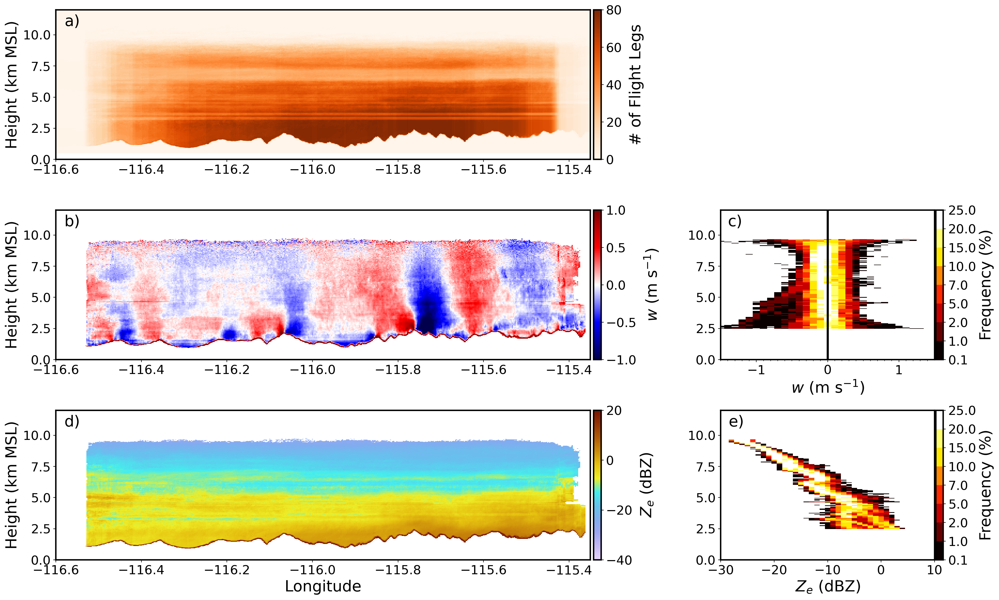

In [18]:
#Here is where the code is composited. The mean of the list above is taken and plotted. This can be subsetted for different flights
#C controls the number of flight legs along a given leg. This was set to 10 when all flight legs were composited.

flight_leg_regrid = np.array(all_velocities)
flight_leg_regrid_dbz = np.array(all_reflectivities)

c = pd.DataFrame(np.count_nonzero(~np.isnan(flight_leg_regrid), axis = 0))

subset_longitudes = np.arange(-116.6, -115.35,  0.0025)




fig, axs = plt.subplots(3, 2, figsize = (20, 12), gridspec_kw={'width_ratios': [2.5, 1]})

cm = axs[0, 0].pcolormesh(subset_longitudes[1:], gate1d/1000, c.T, cmap = 'Oranges')

axs[0, 0].set_xlim(-116.6, -115.35)
axs[0, 0].set_ylim(0, 12)
axs[0, 0].set_ylabel('Height (km MSL)', fontsize = 22)

axs[0, 0].tick_params(labelsize = 18)

cbar = plt.colorbar(cm, pad = 0.005,  ax = axs[0, 0])
cbar.set_label('# of Flight Legs', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)

axs[0, 0].text(-116.58, 10.7, r'a)', fontsize=22)


axs[0, 1].axis('off')


cm = axs[1, 0].pcolormesh(subset_longitudes[1:], gate1d/1000, pd.DataFrame(np.nanmean(flight_leg_regrid, axis = 0))[c > 5].T, vmin = -1, vmax = 1, cmap = 'seismic')

axs[1, 0].set_xlim(-116.6, -115.35)
axs[1, 0].set_ylim(0, 12)

axs[1, 0].set_ylabel('Height (km MSL)', fontsize = 22)

axs[1, 0].tick_params(labelsize = 18)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs[1, 0])
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)

axs[1, 0].text(-116.58, 10.7, r'b)', fontsize=22)


cmap = plt.get_cmap('hot')
fraction_levels = [.1, 1, 2, 5, 7, 10, 15, 20, 25]
norm = BoundaryNorm(fraction_levels, ncolors=cmap.N)

x_vel_cfad, y_vel_cfad, vel_cfad = CFAD_vel(pd.DataFrame(np.nanmean(flight_leg_regrid, axis = 0))[c > 5].values)
vel_cfad[vel_cfad.index < 2500] = np.nan
pm = axs[1, 1].pcolormesh(x_vel_cfad, y_vel_cfad, vel_cfad, cmap = cmap, norm=norm, rasterized = True)
axs[1, 1].set_ylim(0, 12)
axs[1, 1].tick_params(which='both',labelsize=18)
axs[1, 1].set_xlabel('$w$ (m s$^{-1}$)', fontsize = 22)
axs[1, 1].axvline(x=0, color = 'black', linewidth = 3)

axs[1, 1].set_xticks(np.arange(-1.5, 1.5, 0.1), minor = True)

cbar = fig.colorbar(pm, label = 'm s$^{-1}$)', ax=axs[1, 1], pad=0.005)
cbar.ax.tick_params(labelsize=18) 
cbar.set_label(label='Frequency (%)',fontsize= 22)

axs[1, 1].text(-1.4, 10.7, r'c)', fontsize=22)

axs[1, 1].set_xlim(-1.5, 1.5)


cm = axs[2, 0].pcolormesh(subset_longitudes[1:], gate1d/1000, pd.DataFrame(np.nanmean(flight_leg_regrid_dbz, axis = 0))[c > 5].T, vmin = -40, vmax = 20, cmap = pyart.graph.cm.LangRainbow12)
axs[2, 0].set_xlim(-116.6, -115.35)
axs[2, 0].set_ylim(0, 12)

axs[2, 0].set_xlabel('Longitude', fontsize = 22)
axs[2, 0].set_ylabel('Height (km MSL)', fontsize = 22)

axs[2, 0].tick_params(labelsize = 18)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs[2, 0])
cbar.set_label('$Z_e$ (dBZ)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)

axs[2, 0].text(-116.58, 10.7, r'd)', fontsize=22)


x_dbz_cfad, y_dbz_cfad, dbz_cfad = CFAD_ref(pd.DataFrame(np.nanmean(flight_leg_regrid_dbz, axis = 0))[c > 5].values)
dbz_cfad[dbz_cfad.index < 2500] = np.nan
pm = axs[2, 1].pcolormesh(x_dbz_cfad, y_dbz_cfad, dbz_cfad, cmap = cmap, norm=norm, rasterized = True)
axs[2, 1].set_ylim(0, 12)
axs[2, 1].set_xlim(-30, 10)
axs[2, 1].tick_params(which='both',labelsize=18)
axs[2, 1].set_xlabel('$Z_e$ (dBZ)', fontsize = 22)

cbar = fig.colorbar(pm, label = 'm s$^{-1}$)', ax=axs[2, 1], pad=0.005)
cbar.ax.tick_params(labelsize=18) 
cbar.set_label(label='Frequency (%)',fontsize= 22)

axs[2, 1].text(-28.5, 10.7, r'e)', fontsize=22)

plt.tight_layout()
plt.show()

# Questions

Please put your answers in a separate cell below each question (30 pts): 

1. Use the flight level data from Research flight 24 to find the start and end times of each research flight (/network/rit/lab/minderlab_rit/SNOWIE_DATA/FLD/). The flight level data contains information on the time, pitch, roll, yaw, altitude, lat, and lon of the aircraft. Typically, flight legs are found by examining the time when the aircraft starts turning after a straight, level flight leg. The flight level data also contains an independent measurement of vertical motion. (4 pts)

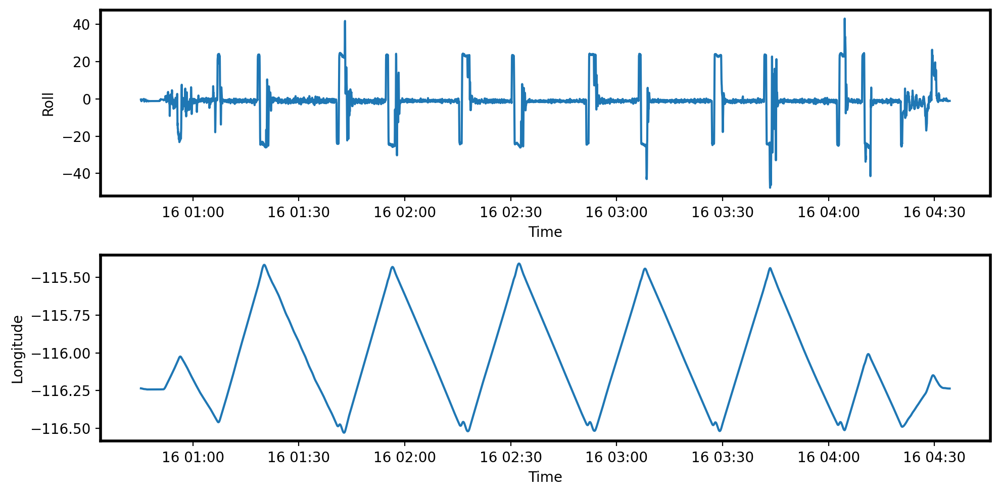

In [19]:
import xarray as xr
fld = xr.open_dataset('//network/rit/lab/minderlab_rit/SNOWIE_DATA/FLD/RF24.nc')
time=np.array(fld['time'])
roll=np.array(fld['AVroll'])
lon=np.array(fld['AVlon'])
lon[200], roll[200]
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
#ax1.plot(time,roll)
#ax2.plot(time,lon)
np.where(lon!=-32768)
lon = lon[287:14030]
roll = roll[287:14030]
time = time[287:14030]
ax1.plot(time,roll)
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time,lon)
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
plt.tight_layout()

In [20]:
lon = lon[287:14030]
roll = roll[287:14030]
time = time[287:14030]

2017-03-16T01:08:29.000000000 2017-03-16T01:18:19.000000000


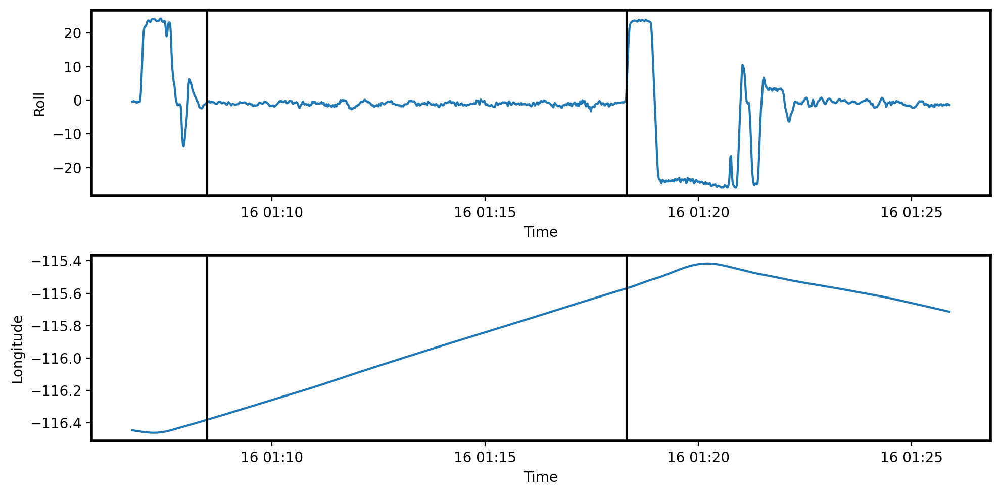

In [21]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[1000:2150],roll[1000:2150])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[1000:2150],lon[1000:2150])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[1105], color='k')
ax2.axvline(time[1105], color='k')
ax1.axvline(time[1695], color='k')
ax2.axvline(time[1695], color='k')
plt.tight_layout()
print(time[1105], time[1695])

2017-03-16T01:22:09.000000000 2017-03-16T01:40:44.000000000


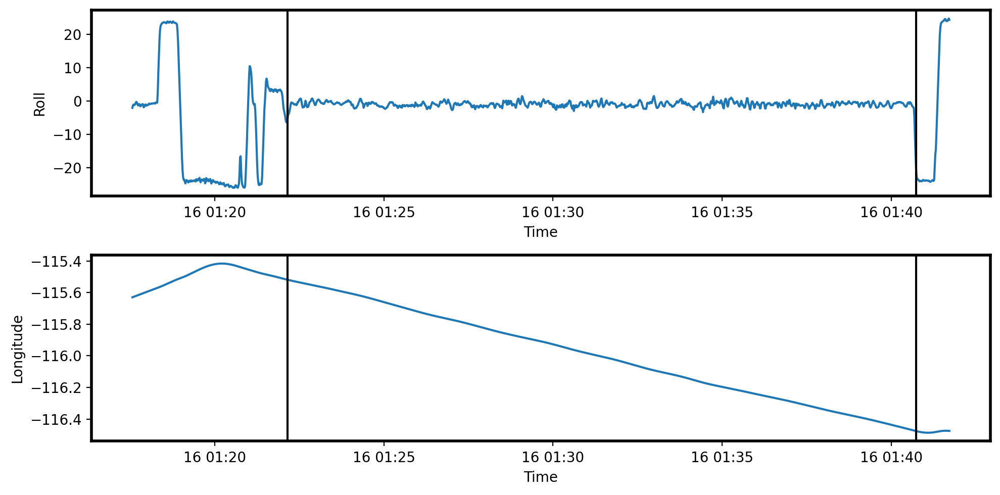

In [22]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[1650:3100],roll[1650:3100])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[1650:3100],lon[1650:3100])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[1925], color='k')
ax2.axvline(time[1925], color='k')
ax1.axvline(time[3040], color='k')
ax2.axvline(time[3040], color='k')
plt.tight_layout()
print(time[1925], time[3040])

2017-03-16T01:45:29.000000000 2017-03-16T01:54:39.000000000


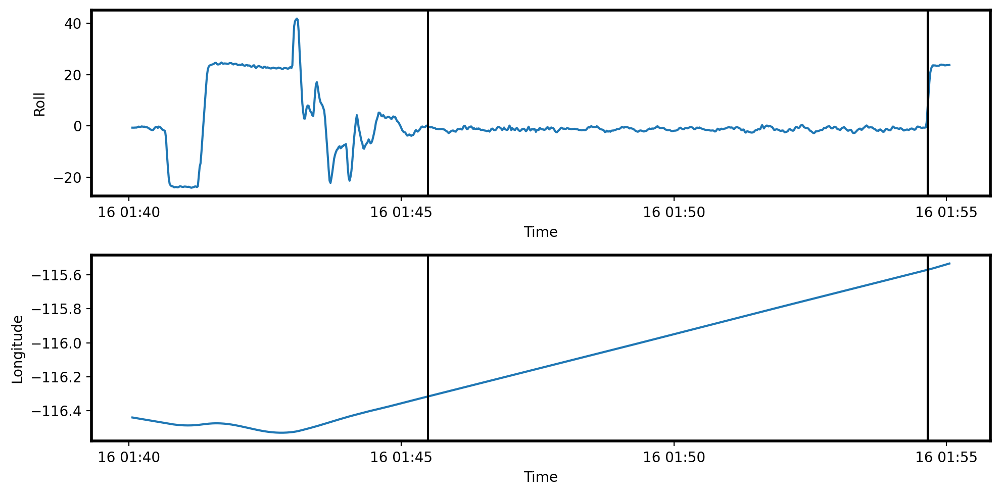

In [23]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[3000:3900],roll[3000:3900])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[3000:3900],lon[3000:3900])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[3325], color='k')
ax2.axvline(time[3325], color='k')
ax1.axvline(time[3875], color='k')
ax2.axvline(time[3875], color='k')
plt.tight_layout()
print(time[3325], time[3875])

2017-03-16T01:58:49.000000000 2017-03-16T02:15:24.000000000


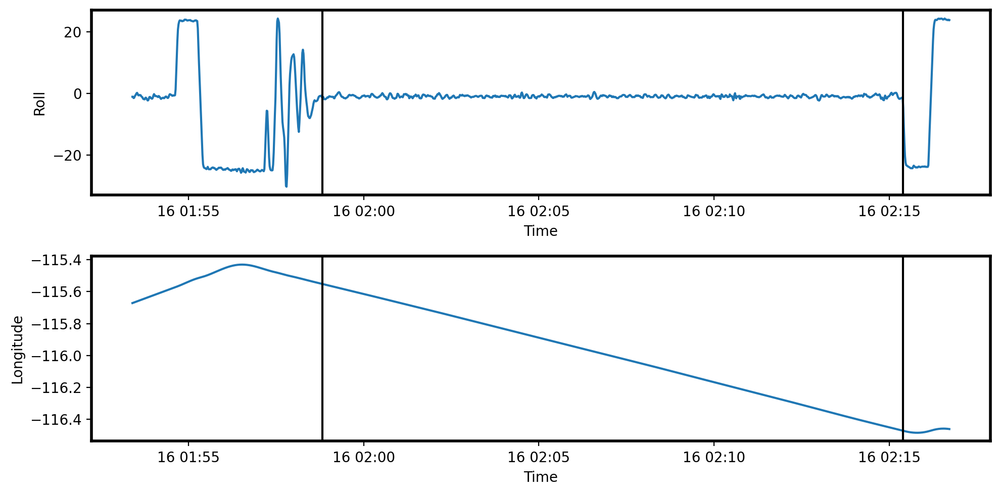

In [24]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[3800:5200],roll[3800:5200])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[3800:5200],lon[3800:5200])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[4125], color='k')
ax2.axvline(time[4125], color='k')
ax1.axvline(time[5120], color='k')
ax2.axvline(time[5120], color='k')
plt.tight_layout()
print(time[4125], time[5120])

2017-03-16T02:19:14.000000000 2017-03-16T02:30:14.000000000


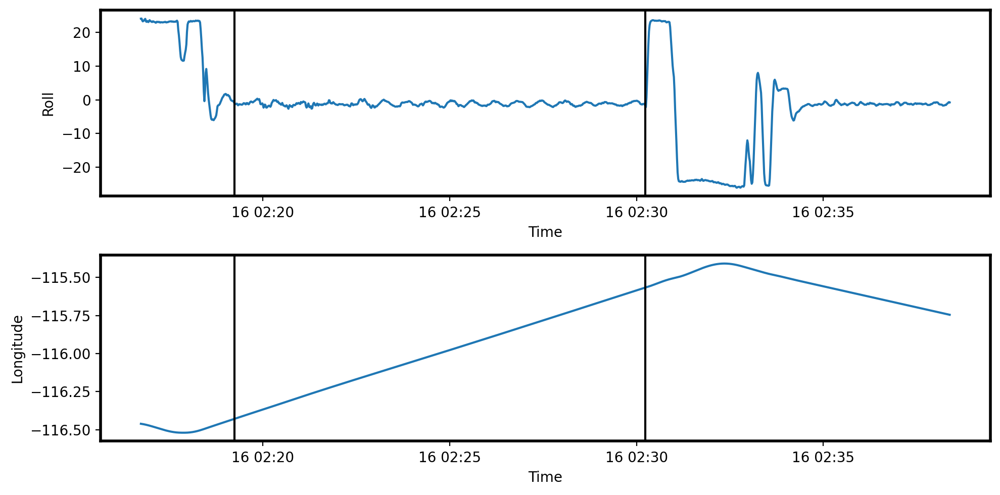

In [25]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[5200:6500],roll[5200:6500])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[5200:6500],lon[5200:6500])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[5350], color='k')
ax2.axvline(time[5350], color='k')
ax1.axvline(time[6010], color='k')
ax2.axvline(time[6010], color='k')
plt.tight_layout()
print(time[5350], time[6010])

2017-03-16T02:34:39.000000000 2017-03-16T02:51:19.000000000


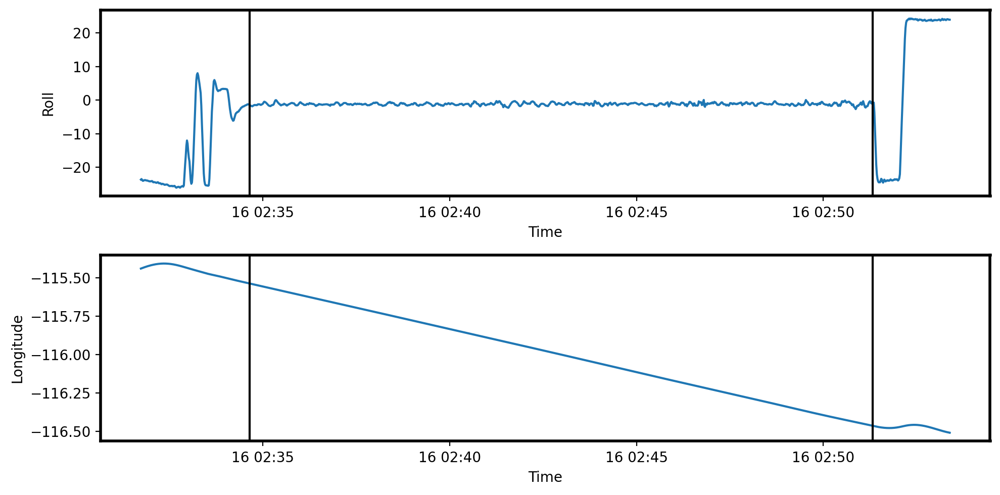

In [26]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[6100:7400],roll[6100:7400])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[6100:7400],lon[6100:7400])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[6275], color='k')
ax2.axvline(time[6275], color='k')
ax1.axvline(time[7275], color='k')
ax2.axvline(time[7275], color='k')
plt.tight_layout()
print(time[6275], time[7275])

2017-03-16T02:55:04.000000000 2017-03-16T03:06:14.000000000


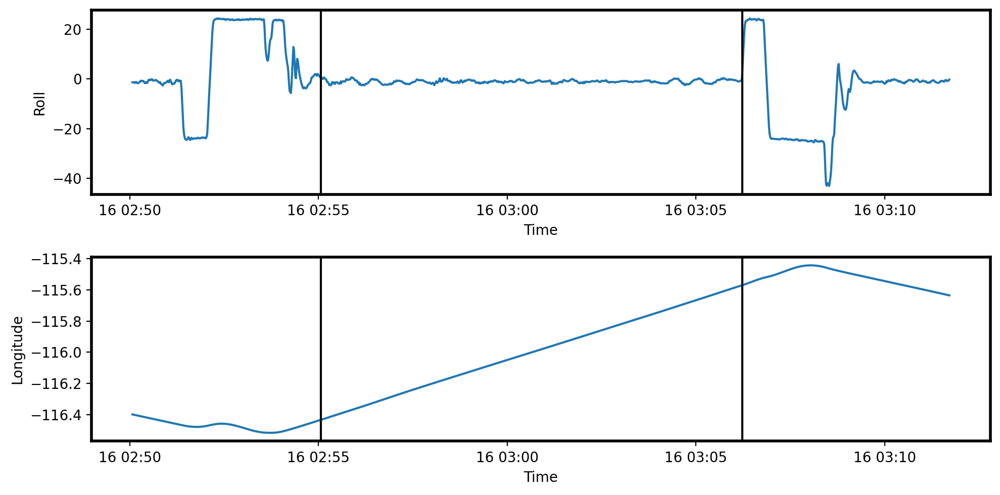

In [27]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[7200:8500],roll[7200:8500])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[7200:8500],lon[7200:8500])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[7500], color='k')
ax2.axvline(time[7500], color='k')
ax1.axvline(time[8170], color='k')
ax2.axvline(time[8170], color='k')
plt.tight_layout()
print(time[7500], time[8170])

2017-03-16T03:09:19.000000000 2017-03-16T03:26:59.000000000


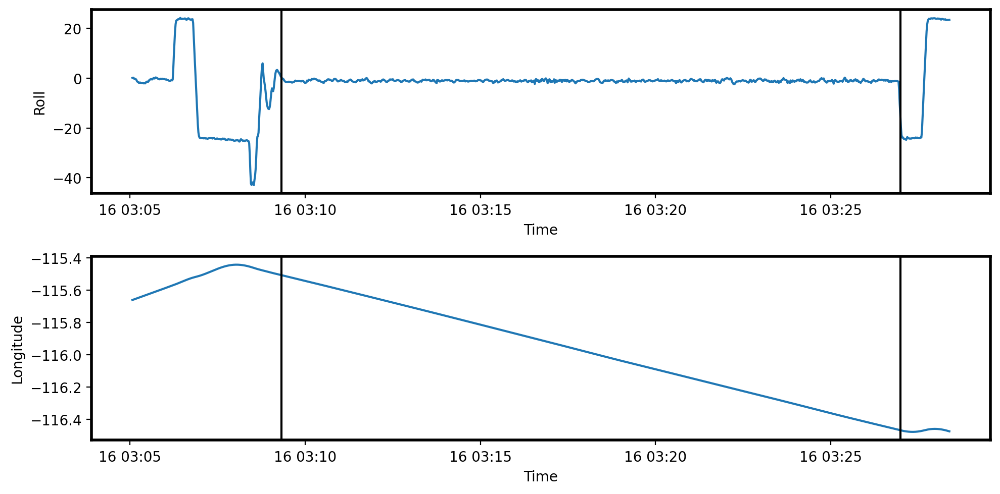

In [28]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[8100:9500],roll[8100:9500])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[8100:9500],lon[8100:9500])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[8355], color='k')
ax2.axvline(time[8355], color='k')
ax1.axvline(time[9415], color='k')
ax2.axvline(time[9415], color='k')
plt.tight_layout()
print(time[8355], time[9415])

2017-03-16T03:30:44.000000000 2017-03-16T03:41:44.000000000


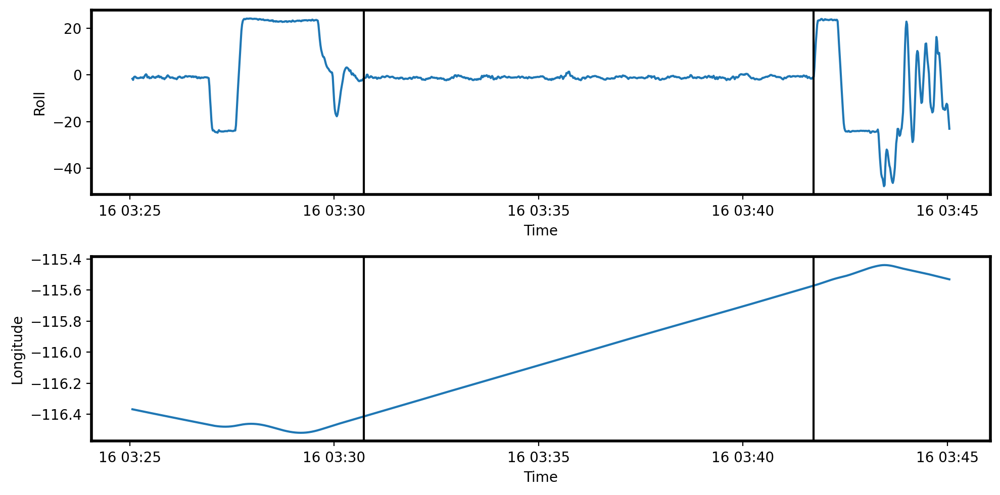

In [29]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[9300:10500],roll[9300:10500])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[9300:10500],lon[9300:10500])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[9640], color='k')
ax2.axvline(time[9640], color='k')
ax1.axvline(time[10300], color='k')
ax2.axvline(time[10300], color='k')
plt.tight_layout()
print(time[9640], time[10300])

2017-03-16T03:45:54.000000000 2017-03-16T04:02:19.000000000


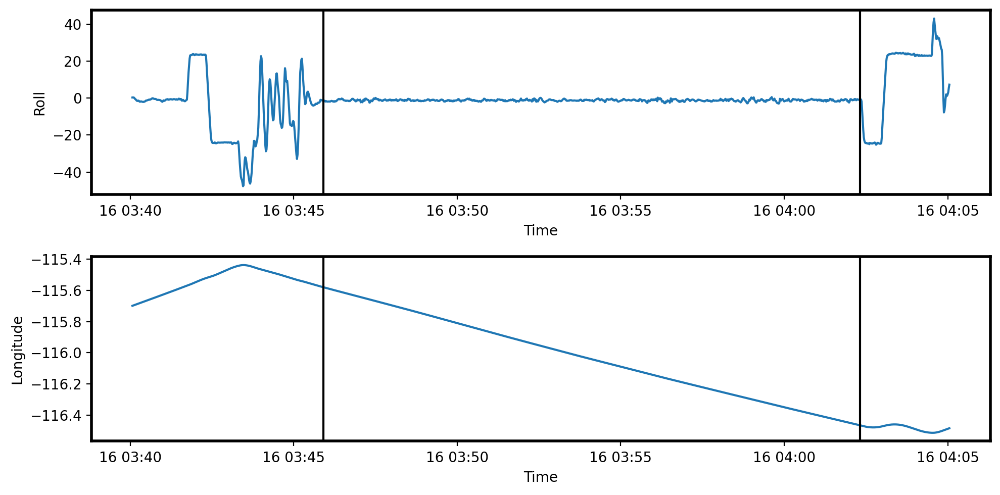

In [30]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[10200:11700],roll[10200:11700])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[10200:11700],lon[10200:11700])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[10550], color='k')
ax2.axvline(time[10550], color='k')
ax1.axvline(time[11535], color='k')
ax2.axvline(time[11535], color='k')
plt.tight_layout()
print(time[10550], time[11535])

2017-03-16T04:05:39.000000000 2017-03-16T04:09:29.000000000


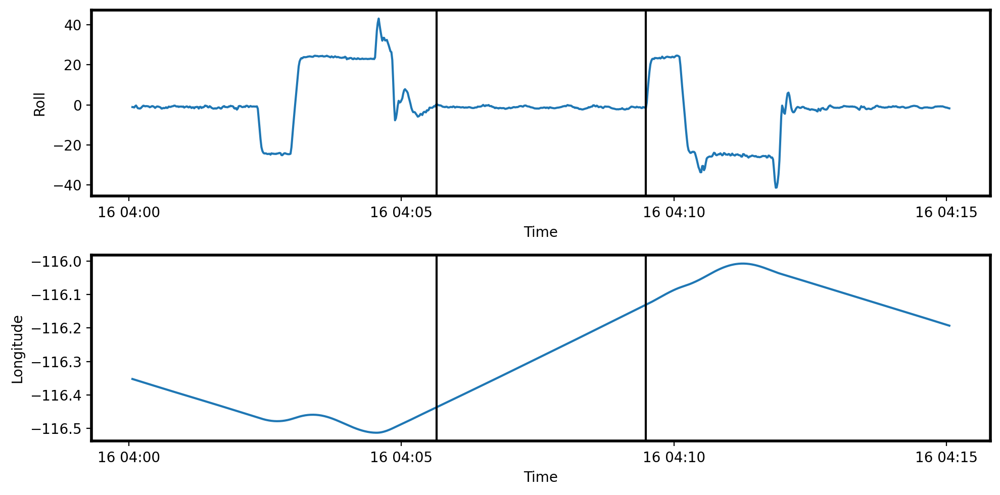

In [31]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[11400:12300],roll[11400:12300])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[11400:12300],lon[11400:12300])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[11735], color='k')
ax2.axvline(time[11735], color='k')
ax1.axvline(time[11965], color='k')
ax2.axvline(time[11965], color='k')
plt.tight_layout()
print(time[11735], time[11965])

2017-03-16T04:12:14.000000000 2017-03-16T04:20:29.000000000


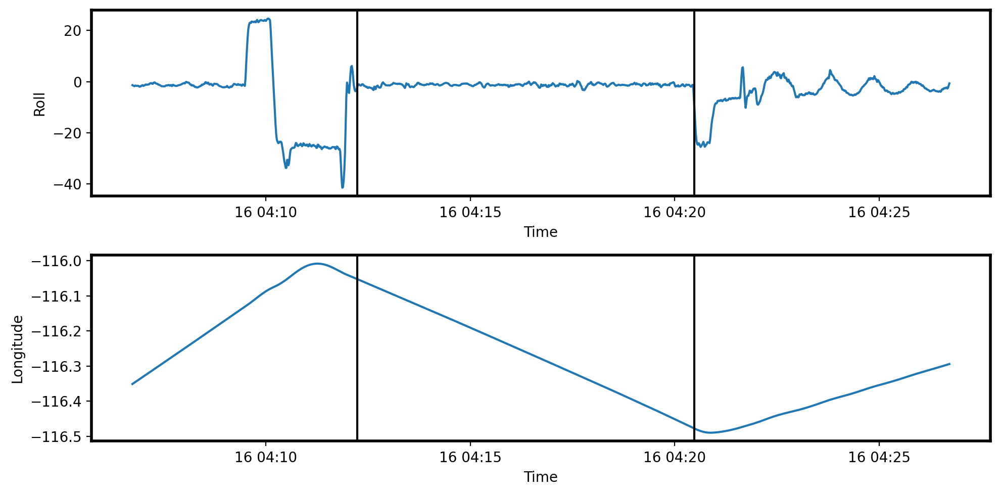

In [32]:
plt.figure(figsize=(10,5))
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
np.where(lon!=-32768)
ax1.plot(time[11800:13000],roll[11800:13000])
ax1.set_ylabel('Roll')
ax1.set_xlabel('Time')
ax2.plot(time[11800:13000],lon[11800:13000])
ax2.set_ylabel('Longitude')
ax2.set_xlabel('Time')
ax1.axvline(time[12130], color='k')
ax2.axvline(time[12130], color='k')
ax1.axvline(time[12625], color='k')
ax2.axvline(time[12625], color='k')
plt.tight_layout()
print(time[12130], time[12625])

In [33]:
iop_t =       [['2017-03-16 01:08:29', '2017-03-16 01:18:19', '1', 0],
               ['2017-03-16 01:22:09', '2017-03-16 01:40:44', '2', 1],
               ['2017-03-16 01:45:29', '2017-03-16 01:54:39', '3', 0],
               ['2017-03-16 01:58:49', '2017-03-16 02:15:24', '4', 1],
               ['2017-03-16 02:19:14', '2017-03-16 02:30:14', '5', 1],
               ['2017-03-16 02:34:39', '2017-03-16 02:51:19', '6', 0],
               ['2017-03-16 02:55:04', '2017-03-16 03:06:14', '7', 1],
               ['2017-03-16 03:09:19', '2017-03-16 03:26:59', '8', 0],
               ['2017-03-16 03:30:44', '2017-03-16 03:41:44', '9', 1],
               ['2017-03-16 03:45:54', '2017-03-16 04:02:19','10', 0],
               ['2017-03-16 04:05:39', '2017-03-16 04:09:29','11', 1],
               ['2017-03-16 04:12:00', '2017-03-16 04:20:29','12', 0]]

## iop_t =       [['2017-03-16 01:08:29', '2017-03-16 01:18:19', '1', 0],
##               ['2017-03-16 01:22:09', '2017-03-16 01:40:44', '2', 1],
##               ['2017-03-16 01:45:29', '2017-03-16 01:54:39', '3', 0],
##               ['2017-03-16 01:58:49', '2017-03-16 02:15:24', '4', 1],
##              ['2017-03-16 02:19:14', '2017-03-16 02:30:14', '5', 1],
##               ['2017-03-16 02:34:39', '2017-03-16 02:51:19', '6', 0],
##              ['2017-03-16 02:55:04', '2017-03-16 03:06:14', '7', 1],
##              ['2017-03-16 03:09:19', '2017-03-16 03:26:59', '8', 0],
##               ['2017-03-16 03:30:44', '2017-03-16 03:41:44', '9', 1],
##               ['2017-03-16 03:45:54', '2017-03-16 04:02:19','10', 0],
##               ['2017-03-16 04:05:39', '2017-03-16 04:09:29','11', 1],
##               ['2017-03-16 04:12:00', '2017-03-16 04:20:29','12', 0]]

2. What range of altitude did the UWKA fly at during this mission? (2 pts)

In [34]:
print('from ' + str(fld['ztrue'].min().values) + ' m to ' + str(fld['ztrue'].max().values) + ' m')

from 826.6670532226562 m to 5281.0771484375 m


## From 826.6670532226562 m to 5281.0771484375 m

3. Composite all of the flight legs from research flight 24. What updraft structures does the composite reveal?  What were the magnitudes of updrafts and downdrafts along the flight track? At flight level? How does that compare to updraft structures observed on indiviual flight legs from research flight 24? (10 pts)

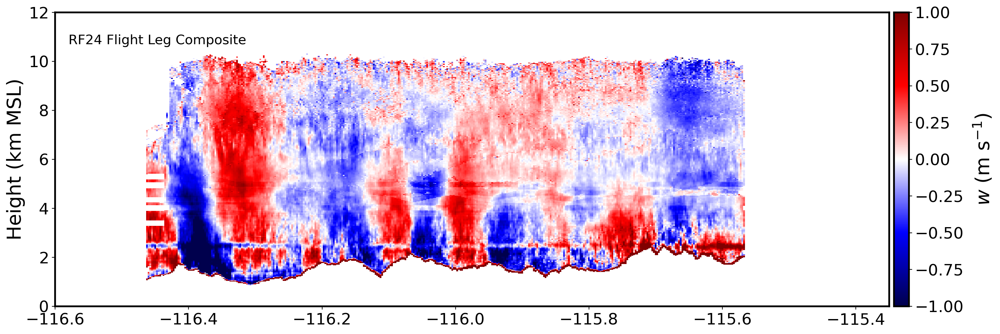

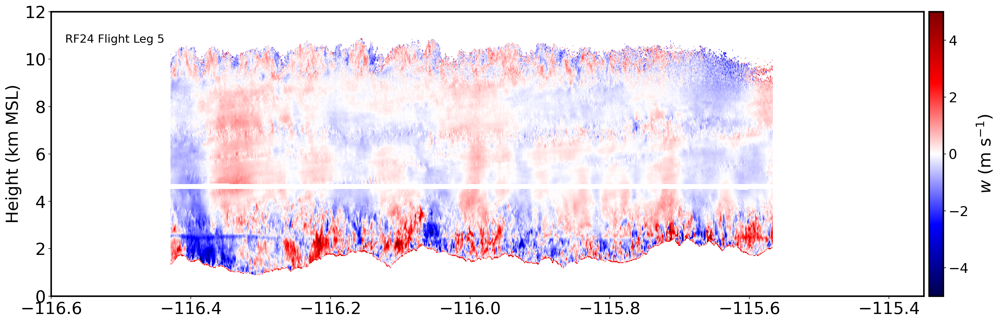

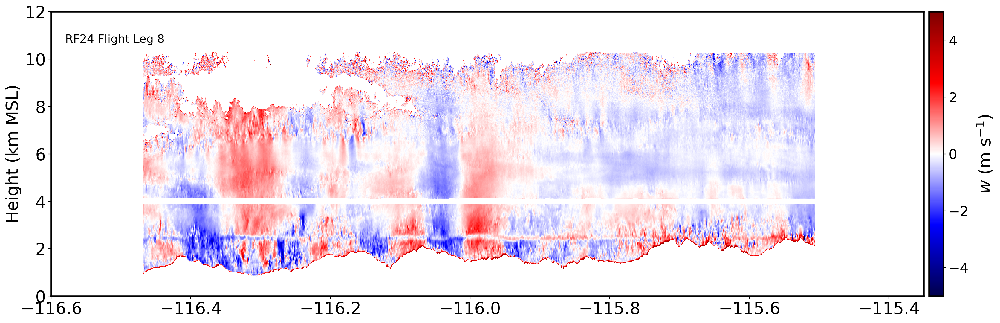

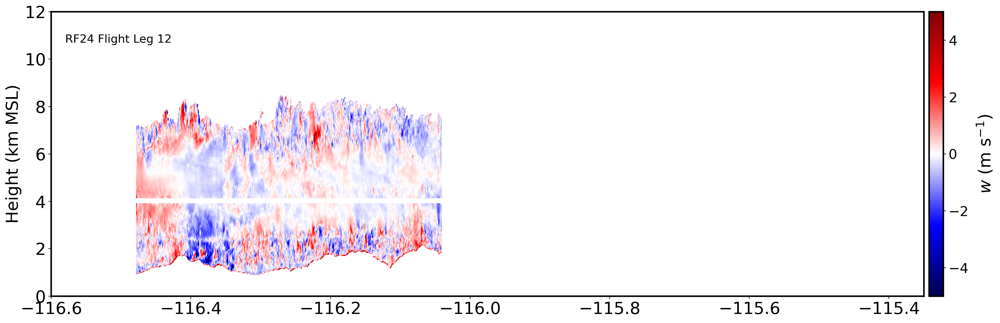

In [35]:
all_velocities = []
all_reflectivities = []
rf_all = []

rf = 'RF24'
iop_t =       [['2017-03-16 01:08:29', '2017-03-16 01:18:19', '1', 0],
               ['2017-03-16 01:22:09', '2017-03-16 01:40:44', '2', 1],
               ['2017-03-16 01:45:29', '2017-03-16 01:54:39', '3', 0],
               ['2017-03-16 01:58:49', '2017-03-16 02:15:24', '4', 1],
               ['2017-03-16 02:19:14', '2017-03-16 02:30:14', '5', 1],
               ['2017-03-16 02:34:39', '2017-03-16 02:51:19', '6', 0],
               ['2017-03-16 02:55:04', '2017-03-16 03:06:14', '7', 1],
               ['2017-03-16 03:09:19', '2017-03-16 03:26:59', '8', 0],
               ['2017-03-16 03:30:44', '2017-03-16 03:41:44', '9', 1],
               ['2017-03-16 03:45:54', '2017-03-16 04:02:19','10', 0],
               ['2017-03-16 04:05:39', '2017-03-16 04:09:29','11', 1],
               ['2017-03-16 04:12:00', '2017-03-16 04:20:29','12', 0]]

for i in range(len(iop_t)): 

        timeidx = i

        start_time = iop_t[timeidx][0]
        end_time = iop_t[timeidx][1]

        wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')
        og_vel = np.array(wcr_read_in['VEL'][:])
        ref = np.array(wcr_read_in['DBZ'][:])

        time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
        gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

        lat = wcr_read_in['Lat'][:]
        lon = wcr_read_in['Lon'][:]

        index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

        time_subset = time1d[index_time_wanted_wcr]
        vel_subset = og_vel[index_time_wanted_wcr]
        ref_subset = ref[index_time_wanted_wcr]

        lat_subset = lat[index_time_wanted_wcr]
        lon_subset = lon[index_time_wanted_wcr]

        w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values



        leg_lon_df = pd.DataFrame()
        leg_lon_df['Lon'] = lon_subset

        gb = leg_lon_df['Lon'].groupby(pd.cut(lon_subset, np.arange(-116.6, -115.35,  0.0025)))
        leg_dictionary = gb.indices


        leg_mean_w_fl = []
        leg_mean_ref_fl = []
        for key in leg_dictionary:    
            if len(leg_dictionary[key]) == 0: 

                empty_array = np.empty(gate1d.shape[0])
                empty_array[:] = np.nan
                leg_mean_w_fl.append(empty_array)
                leg_mean_ref_fl.append(empty_array)

            else: 
                leg_mean_w_fl.append(np.nanmean(w_estimate_mean[np.array(leg_dictionary[key])], axis = 0))
                leg_mean_ref_fl.append(np.nanmean(ref_subset[np.array(leg_dictionary[key])], axis = 0))


        all_reflectivities.append(leg_mean_ref_fl)
        all_velocities.append(leg_mean_w_fl)
        rf_all.append(rf)
        

flight_leg_regrid = np.array(all_velocities)
flight_leg_regrid_dbz = np.array(all_reflectivities)

c = pd.DataFrame(np.count_nonzero(~np.isnan(flight_leg_regrid), axis = 0))

subset_longitudes = np.arange(-116.6, -115.35,  0.0025)




fig, axs = plt.subplots(1, figsize = (20, 6))



cm = axs.pcolormesh(subset_longitudes[1:], gate1d/1000, pd.DataFrame(np.nanmean(flight_leg_regrid, axis = 0))[c > 5].T, vmin = -1, vmax = 1, cmap = 'seismic')

axs.set_xlim(-116.6, -115.35)
axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 18)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)

axs.text(-116.58, 10.7, r'RF24 Flight Leg Composite', fontsize=15)




rf = 'RF24'
iop_t =       [['2017-03-16 01:08:29', '2017-03-16 01:18:19', '1', 0],
               ['2017-03-16 01:22:09', '2017-03-16 01:40:44', '2', 1],
               ['2017-03-16 01:45:29', '2017-03-16 01:54:39', '3', 0],
               ['2017-03-16 01:58:49', '2017-03-16 02:15:24', '4', 1],
               ['2017-03-16 02:19:14', '2017-03-16 02:30:14', '5', 1],
               ['2017-03-16 02:34:39', '2017-03-16 02:51:19', '6', 0],
               ['2017-03-16 02:55:04', '2017-03-16 03:06:14', '7', 1],
               ['2017-03-16 03:09:19', '2017-03-16 03:26:59', '8', 0],
               ['2017-03-16 03:30:44', '2017-03-16 03:41:44', '9', 1],
               ['2017-03-16 03:45:54', '2017-03-16 04:02:19','10', 0],
               ['2017-03-16 04:05:39', '2017-03-16 04:09:29','11', 1],
               ['2017-03-16 04:12:00', '2017-03-16 04:20:29','12', 0]]
#Picking a flight leg (in this case the 5th leg)from the list above 
flight_leg = 4

#isolating it's start and end times
start_time = iop_t[flight_leg][0]
end_time = iop_t[flight_leg][1]

#Reading in the radar data
wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')

#isolating variables within the radar data
og_vel = np.array(wcr_read_in['VEL'][:])
ref = np.array(wcr_read_in['DBZ'][:])

time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

lat = wcr_read_in['Lat'][:]
lon = wcr_read_in['Lon'][:]

#subsetting for the time wanted along the flight leg
index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

time_subset = time1d[index_time_wanted_wcr]
vel_subset = og_vel[index_time_wanted_wcr]
ref_subset = ref[index_time_wanted_wcr]

lat_subset = lat[index_time_wanted_wcr]
lon_subset = lon[index_time_wanted_wcr]

w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values

#Calling the functions above and creating CFADs for reflectivity and radial velocity. 

fig, axs = plt.subplots(figsize = (20, 6))








cm = axs.pcolormesh(lon_subset, gate1d/1000, w_estimate_mean.T, vmin = -5, vmax = 5, cmap = 'seismic')

axs.set_xlim(-116.6, -115.35)
axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 22)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)


axs.text(-116.58, 10.7, r'RF24 Flight Leg 5', fontsize=15)


plt.tight_layout()
plt.show()



rf = 'RF24'
iop_t =       [['2017-03-16 01:08:29', '2017-03-16 01:18:19', '1', 0],
               ['2017-03-16 01:22:09', '2017-03-16 01:40:44', '2', 1],
               ['2017-03-16 01:45:29', '2017-03-16 01:54:39', '3', 0],
               ['2017-03-16 01:58:49', '2017-03-16 02:15:24', '4', 1],
               ['2017-03-16 02:19:14', '2017-03-16 02:30:14', '5', 1],
               ['2017-03-16 02:34:39', '2017-03-16 02:51:19', '6', 0],
               ['2017-03-16 02:55:04', '2017-03-16 03:06:14', '7', 1],
               ['2017-03-16 03:09:19', '2017-03-16 03:26:59', '8', 0],
               ['2017-03-16 03:30:44', '2017-03-16 03:41:44', '9', 1],
               ['2017-03-16 03:45:54', '2017-03-16 04:02:19','10', 0],
               ['2017-03-16 04:05:39', '2017-03-16 04:09:29','11', 1],
               ['2017-03-16 04:12:00', '2017-03-16 04:20:29','12', 0]]
#Picking a flight leg (in this case the 5th leg)from the list above 
flight_leg = 7

#isolating it's start and end times
start_time = iop_t[flight_leg][0]
end_time = iop_t[flight_leg][1]

#Reading in the radar data
wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')

#isolating variables within the radar data
og_vel = np.array(wcr_read_in['VEL'][:])
ref = np.array(wcr_read_in['DBZ'][:])

time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

lat = wcr_read_in['Lat'][:]
lon = wcr_read_in['Lon'][:]

#subsetting for the time wanted along the flight leg
index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

time_subset = time1d[index_time_wanted_wcr]
vel_subset = og_vel[index_time_wanted_wcr]
ref_subset = ref[index_time_wanted_wcr]

lat_subset = lat[index_time_wanted_wcr]
lon_subset = lon[index_time_wanted_wcr]

w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values

#Calling the functions above and creating CFADs for reflectivity and radial velocity. 

fig, axs = plt.subplots(figsize = (20, 6))








cm = axs.pcolormesh(lon_subset, gate1d/1000, w_estimate_mean.T, vmin = -5, vmax = 5, cmap = 'seismic')

axs.set_xlim(-116.6, -115.35)
axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 22)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)


axs.text(-116.58, 10.7, r'RF24 Flight Leg 8', fontsize=15)


plt.tight_layout()
plt.show()




rf = 'RF24'
iop_t =       [['2017-03-16 01:08:29', '2017-03-16 01:18:19', '1', 0],
               ['2017-03-16 01:22:09', '2017-03-16 01:40:44', '2', 1],
               ['2017-03-16 01:45:29', '2017-03-16 01:54:39', '3', 0],
               ['2017-03-16 01:58:49', '2017-03-16 02:15:24', '4', 1],
               ['2017-03-16 02:19:14', '2017-03-16 02:30:14', '5', 1],
               ['2017-03-16 02:34:39', '2017-03-16 02:51:19', '6', 0],
               ['2017-03-16 02:55:04', '2017-03-16 03:06:14', '7', 1],
               ['2017-03-16 03:09:19', '2017-03-16 03:26:59', '8', 0],
               ['2017-03-16 03:30:44', '2017-03-16 03:41:44', '9', 1],
               ['2017-03-16 03:45:54', '2017-03-16 04:02:19','10', 0],
               ['2017-03-16 04:05:39', '2017-03-16 04:09:29','11', 1],
               ['2017-03-16 04:12:00', '2017-03-16 04:20:29','12', 0]]
#Picking a flight leg (in this case the 5th leg)from the list above 
flight_leg = 11

#isolating it's start and end times
start_time = iop_t[flight_leg][0]
end_time = iop_t[flight_leg][1]

#Reading in the radar data
wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')

#isolating variables within the radar data
og_vel = np.array(wcr_read_in['VEL'][:])
ref = np.array(wcr_read_in['DBZ'][:])

time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

lat = wcr_read_in['Lat'][:]
lon = wcr_read_in['Lon'][:]

#subsetting for the time wanted along the flight leg
index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

time_subset = time1d[index_time_wanted_wcr]
vel_subset = og_vel[index_time_wanted_wcr]
ref_subset = ref[index_time_wanted_wcr]

lat_subset = lat[index_time_wanted_wcr]
lon_subset = lon[index_time_wanted_wcr]

w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values

#Calling the functions above and creating CFADs for reflectivity and radial velocity. 

fig, axs = plt.subplots(figsize = (20, 6))








cm = axs.pcolormesh(lon_subset, gate1d/1000, w_estimate_mean.T, vmin = -5, vmax = 5, cmap = 'seismic')

axs.set_xlim(-116.6, -115.35)
axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 22)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)


axs.text(-116.58, 10.7, r'RF24 Flight Leg 12', fontsize=15)


plt.tight_layout()
plt.show()

## The composite reveals a wavelike struture to the updrafts and downdrafts, where there are updrafts followed by downdrafts followed by updrafts. The phase lines are constant with height, and the updrafts and downdrafts seem to decay with height. Along the flight track, the magnitudes of the updrafts and downdrafts ranged from -1.00 m/s to 1.00 m/s. These updrafts and downdrafts were strongest within the lower range of flight level, close to the surface. There are updrafts generally along the upslope terrain and downdrafts generally along the downslope terrain. In contrast, the transient updrafts and downdrafts seen on the individual legs are much more noisy. In several locations, there are still broad updrafts along upslope regions and broad downdrafts along downslope regions. The strength of the updrafts and downdrafts still decay with height, but now they range from -5.00 m/s to 5.00 m/s. The structure of the updrafts and downdrafts are more similar to the composite aloft, but close to the surface they are more noisy. These transient updrafts and downdrafts are likely due to shallow embedded convection as a result of orographic lifting releasing potential instability, cloud top generating cells with shear induced turbulence, or boundary layer turbulence. 

4. Plot three examples of transient updraft features sampled during the SNOWIE field campaign.  Note what the updraft structures are and their typical and maximum magnitudes.  How do they differ from the fixed orographic updrafts plotted in the previous question? (6 pts)


    - Research Flight 1 Flight Leg 4
    - Research Flight 2 Flight Leg 10
    - Research Flight 12 Flight Leg 3
    - Research Flight 13 Flight Leg 3
    - Research Flight 15 Flight Leg 8
    - Research Flight 16 Flight Leg 4
    - Research Flight 20 Flight Leg 6

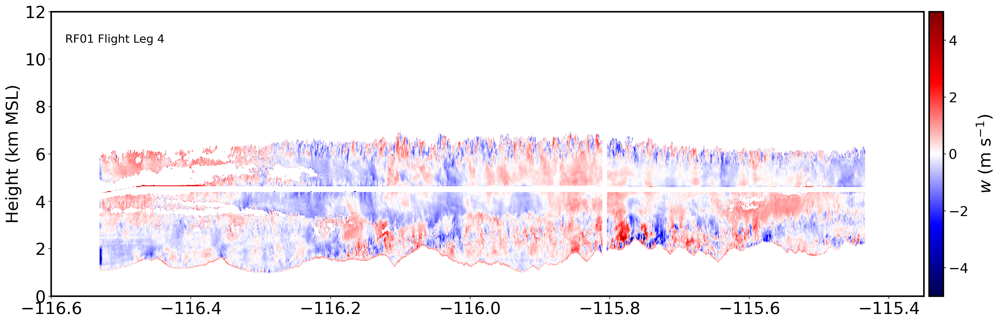

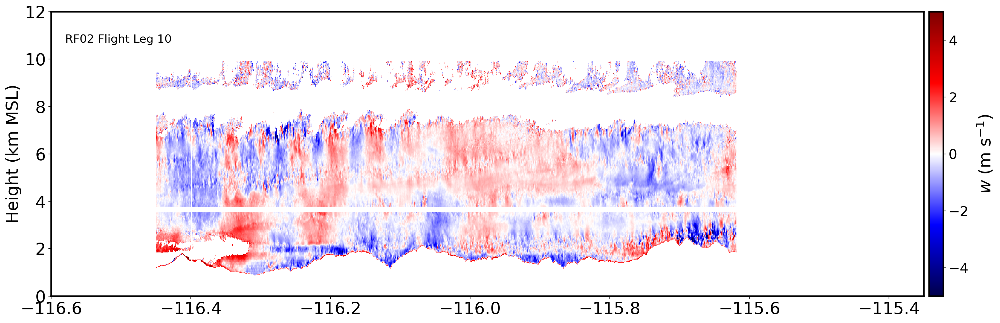

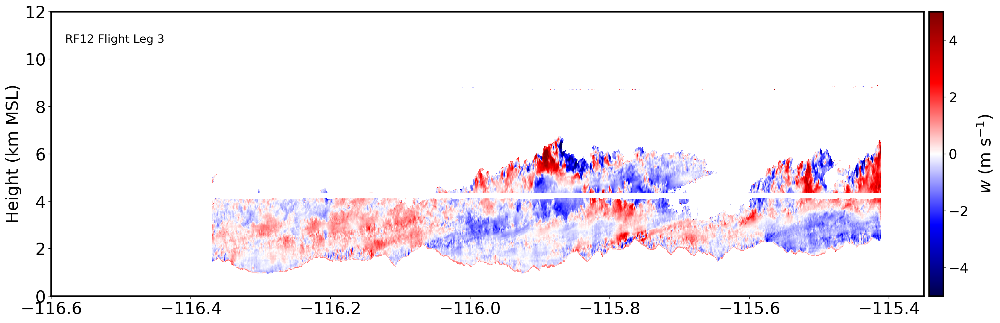

In [36]:
rf = 'RF01'
iop_t =  [
                  ['2017-01-08 02:46:30', '2017-01-08 02:56:10', '1', 0],
                  ['2017-01-08 03:00:10', '2017-01-08 03:16:10', '2', 1],
                  ['2017-01-08 03:20:25', '2017-01-08 03:27:30', '3', 0],
                  ['2017-01-08 03:31:30', '2017-01-08 03:51:00', '4', 1],
                  ['2017-01-08 03:54:15', '2017-01-08 04:05:10', '5', 0],
                  ['2017-01-08 04:08:00', '2017-01-08 04:29:00', '6', 1],
                  ['2017-01-08 04:32:00', '2017-01-08 04:43:00', '7', 0],
                  ['2017-01-08 04:46:00', '2017-01-08 05:06:50', '8', 1],
                  ['2017-01-08 05:10:00', '2017-01-08 05:21:00', '9', 0],
                  ['2017-01-08 05:24:30', '2017-01-08 05:40:10', '10', 1]]
#Picking a flight leg (in this case the 5th leg)from the list above 
flight_leg = 3

#isolating it's start and end times
start_time = iop_t[flight_leg][0]
end_time = iop_t[flight_leg][1]

#Reading in the radar data
wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')

#isolating variables within the radar data
og_vel = np.array(wcr_read_in['VEL'][:])
ref = np.array(wcr_read_in['DBZ'][:])

time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

lat = wcr_read_in['Lat'][:]
lon = wcr_read_in['Lon'][:]

#subsetting for the time wanted along the flight leg
index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

time_subset = time1d[index_time_wanted_wcr]
vel_subset = og_vel[index_time_wanted_wcr]
ref_subset = ref[index_time_wanted_wcr]

lat_subset = lat[index_time_wanted_wcr]
lon_subset = lon[index_time_wanted_wcr]

w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values

#Calling the functions above and creating CFADs for reflectivity and radial velocity. 

fig, axs = plt.subplots(figsize = (20, 6))








cm = axs.pcolormesh(lon_subset, gate1d/1000, w_estimate_mean.T, vmin = -5, vmax = 5, cmap = 'seismic')

axs.set_xlim(-116.6, -115.35)

axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 22)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)


axs.text(-116.58, 10.7, r'RF01 Flight Leg 4', fontsize=15)


plt.tight_layout()
plt.show()










rf = 'RF02'
iop_t = [
                 ['2017-01-09 04:35:30', '2017-01-09 04:46:00', '1', 0],
                 ['2017-01-09 04:50:20', '2017-01-09 05:06:10', '2', 1],
                 ['2017-01-09 05:09:30', '2017-01-09 05:17:25', '3', 0],
                 ['2017-01-09 05:21:20', '2017-01-09 05:38:00', '4', 1],
                 ['2017-01-09 05:42:00', '2017-01-09 05:50:20', '5', 0],
                 ['2017-01-09 05:54:30', '2017-01-09 06:13:50', '6', 1],
                 ['2017-01-09 06:17:10', '2017-01-09 06:28:00', '7', 0],
                 ['2017-01-09 06:32:00', '2017-01-09 06:50:20', '8', 1],
                 ['2017-01-09 06:55:00', '2017-01-09 07:04:50', '9',0],
                 ['2017-01-09 07:09:00', '2017-01-09 07:26:30','10',1]]
#Picking a flight leg (in this case the 5th leg)from the list above 
flight_leg = 9

#isolating it's start and end times
start_time = iop_t[flight_leg][0]
end_time = iop_t[flight_leg][1]

#Reading in the radar data
wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')

#isolating variables within the radar data
og_vel = np.array(wcr_read_in['VEL'][:])
ref = np.array(wcr_read_in['DBZ'][:])

time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

lat = wcr_read_in['Lat'][:]
lon = wcr_read_in['Lon'][:]

#subsetting for the time wanted along the flight leg
index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

time_subset = time1d[index_time_wanted_wcr]
vel_subset = og_vel[index_time_wanted_wcr]
ref_subset = ref[index_time_wanted_wcr]

lat_subset = lat[index_time_wanted_wcr]
lon_subset = lon[index_time_wanted_wcr]

w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values

#Calling the functions above and creating CFADs for reflectivity and radial velocity. 

fig, axs = plt.subplots(figsize = (20, 6))








cm = axs.pcolormesh(lon_subset, gate1d/1000, w_estimate_mean.T, vmin = -5, vmax = 5, cmap = 'seismic')

axs.set_xlim(-116.6, -115.35)

axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 22)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)


axs.text(-116.58, 10.7, r'RF02 Flight Leg 10', fontsize=15)


plt.tight_layout()
plt.show()











rf = 'RF12'
iop_t =[
                ['2017-02-07 20:13:40', '2017-02-07 20:23:35', '1', 0],
                ['2017-02-07 20:26:30', '2017-02-07 20:46:05', '2', 1],
                ['2017-02-07 20:50:00', '2017-02-07 20:59:30', '3', 0],
                ['2017-02-07 21:02:40', '2017-02-07 21:22:25', '4', 1],
                ['2017-02-07 21:25:10', '2017-02-07 21:35:00', '5', 0],
                ['2017-02-07 21:37:10', '2017-02-07 21:56:50', '6', 1],
                ['2017-02-07 21:59:40', '2017-02-07 22:09:35', '7', 0],
                ['2017-02-07 22:12:50', '2017-02-07 22:33:50', '8', 1],
                ['2017-02-07 22:37:00', '2017-02-07 22:46:10', '9', 0],
                ['2017-02-07 22:49:00', '2017-02-07 23:03:00','10', 1]]
#Picking a flight leg (in this case the 5th leg)from the list above 
flight_leg = 2

#isolating it's start and end times
start_time = iop_t[flight_leg][0]
end_time = iop_t[flight_leg][1]

#Reading in the radar data
wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')

#isolating variables within the radar data
og_vel = np.array(wcr_read_in['VEL'][:])
ref = np.array(wcr_read_in['DBZ'][:])

time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

lat = wcr_read_in['Lat'][:]
lon = wcr_read_in['Lon'][:]

#subsetting for the time wanted along the flight leg
index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

time_subset = time1d[index_time_wanted_wcr]
vel_subset = og_vel[index_time_wanted_wcr]
ref_subset = ref[index_time_wanted_wcr]

lat_subset = lat[index_time_wanted_wcr]
lon_subset = lon[index_time_wanted_wcr]

w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values

#Calling the functions above and creating CFADs for reflectivity and radial velocity. 

fig, axs = plt.subplots(figsize = (20, 6))








cm = axs.pcolormesh(lon_subset, gate1d/1000, w_estimate_mean.T, vmin = -5, vmax = 5, cmap = 'seismic')

axs.set_xlim(-116.6, -115.35)

axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 22)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)


axs.text(-116.58, 10.7, r'RF12 Flight Leg 3', fontsize=15)


plt.tight_layout()
plt.show()

## The structure here is less definitive than in other plots. Their typical updraft and downdraft values are fairly weak (-1.0 m/s to 1.0 m/s), while their maxima and minima are stronger (-4.0 m/s to 4.0 m/s). Compared to the fixed waves plotted in the previous question, these updrafts and downdrafts do not seem to have a connection to the terrain, at least in general. These transient updrafts are more likely caused by processes such as shallow embedded convection as a result of orographic lifting releasing potential instability, cloud top generating cells with shear induced turbulence, or boundary layer turbulence. 

5. Create a flight leg composite (for one of the flight tracks like the one above) and create a close up image isolating the fixed updraft and downdraft associated with the strongest waves over the terrain? Which direction was the wind blowing relative to the terrain? How do you know? Explain why the fixed waves slope upwind wind height. Why are stronger vertical motions found closer to the terrain? (8 pts) 

Text(-115.825, 9, 'RF21 Flight Leg Composite Close-Up')

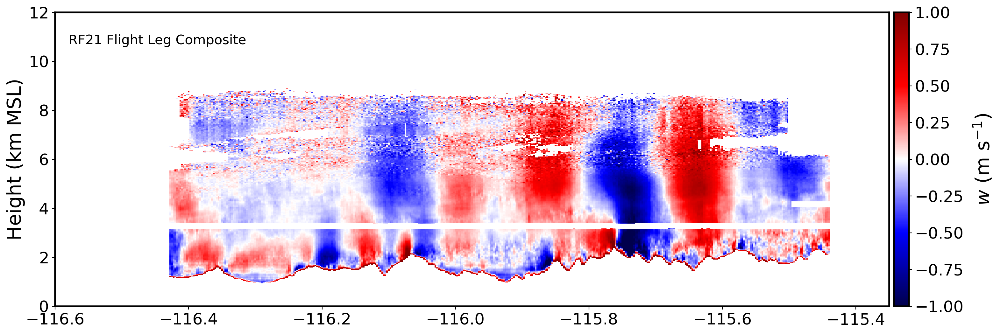

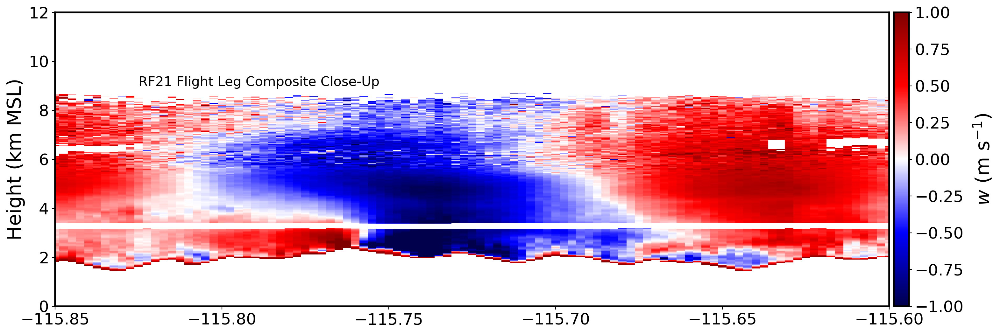

In [37]:
all_velocities = []
all_reflectivities = []
rf_all = []

rf = 'RF21'
iop_t =[
                ['2017-03-07 14:23:30', '2017-03-07 14:33:10', '1', 0],
                ['2017-03-07 14:36:30', '2017-03-07 14:51:30', '2', 1],
                ['2017-03-07 14:55:20', '2017-03-07 15:07:35', '3', 0],
                ['2017-03-07 15:10:10', '2017-03-07 15:23:55', '4', 1],
                ['2017-03-07 15:26:50', '2017-03-07 15:38:20', '5', 0],
                ['2017-03-07 15:40:35', '2017-03-07 15:55:30', '6', 1],
                ['2017-03-07 15:58:25', '2017-03-07 16:10:50', '7', 0], 
                ['2017-03-07 16:13:00', '2017-03-07 16:27:50', '8', 1],
                ['2017-03-07 16:31:15', '2017-03-07 16:42:50', '9', 0],
                ['2017-03-07 16:45:05', '2017-03-07 16:58:55', '10', 1],
                ['2017-03-07 17:01:40', '2017-03-07 17:11:15', '11', 0],
                ['2017-03-07 17:12:40', '2017-03-07 17:16:25', '12', 1],
                ['2017-03-07 17:18:25', '2017-03-07 17:23:00', '13', 0],
                ['2017-03-07 17:25:30', '2017-03-07 17:35:50', '14', 1]]

for i in range(len(iop_t)): 

        timeidx = i

        start_time = iop_t[timeidx][0]
        end_time = iop_t[timeidx][1]

        wcr_read_in = Dataset('/network/rit/lab/minderlab_rit/SNOWIE_DATA/WCR/' + rf + '.nc')
        og_vel = np.array(wcr_read_in['VEL'][:])
        ref = np.array(wcr_read_in['DBZ'][:])

        time1d = np.array(wcr_read_in['time1d'][:], dtype = 'datetime64[ns]')
        gate1d = np.array(wcr_read_in['gateAlt2d'][:][0])

        lat = wcr_read_in['Lat'][:]
        lon = wcr_read_in['Lon'][:]

        index_time_wanted_wcr = np.where((time1d > np.array(start_time, dtype = 'datetime64[ns]')) & (time1d < np.array(end_time, dtype = 'datetime64[ns]')))[0]

        time_subset = time1d[index_time_wanted_wcr]
        vel_subset = og_vel[index_time_wanted_wcr]
        ref_subset = ref[index_time_wanted_wcr]

        lat_subset = lat[index_time_wanted_wcr]
        lon_subset = lon[index_time_wanted_wcr]

        w_estimate_mean = vel_subset - pd.DataFrame(vel_subset).mean(axis = 0).values



        leg_lon_df = pd.DataFrame()
        leg_lon_df['Lon'] = lon_subset

        gb = leg_lon_df['Lon'].groupby(pd.cut(lon_subset, np.arange(-116.6, -115.35,  0.0025)))
        leg_dictionary = gb.indices


        leg_mean_w_fl = []
        leg_mean_ref_fl = []
        for key in leg_dictionary:    
            if len(leg_dictionary[key]) == 0: 

                empty_array = np.empty(gate1d.shape[0])
                empty_array[:] = np.nan
                leg_mean_w_fl.append(empty_array)
                leg_mean_ref_fl.append(empty_array)

            else: 
                leg_mean_w_fl.append(np.nanmean(w_estimate_mean[np.array(leg_dictionary[key])], axis = 0))
                leg_mean_ref_fl.append(np.nanmean(ref_subset[np.array(leg_dictionary[key])], axis = 0))


        all_reflectivities.append(leg_mean_ref_fl)
        all_velocities.append(leg_mean_w_fl)
        rf_all.append(rf)
        

flight_leg_regrid = np.array(all_velocities)
flight_leg_regrid_dbz = np.array(all_reflectivities)

c = pd.DataFrame(np.count_nonzero(~np.isnan(flight_leg_regrid), axis = 0))

subset_longitudes = np.arange(-116.6, -115.35,  0.0025)




fig, axs = plt.subplots(1, figsize = (20, 6))



cm = axs.pcolormesh(subset_longitudes[1:], gate1d/1000, pd.DataFrame(np.nanmean(flight_leg_regrid, axis = 0))[c > 5].T, vmin = -1, vmax = 1, cmap = 'seismic')

axs.set_xlim(-116.6, -115.35)
axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 18)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)

axs.text(-116.58, 10.7, r'RF21 Flight Leg Composite', fontsize=15)







fig, axs = plt.subplots(1, figsize = (20, 6))



cm = axs.pcolormesh(subset_longitudes[1:], gate1d/1000, pd.DataFrame(np.nanmean(flight_leg_regrid, axis = 0))[c > 5].T, vmin = -1, vmax = 1, cmap = 'seismic')

axs.set_xlim(-115.85, -115.6)
axs.set_ylim(0, 12)

axs.set_ylabel('Height (km MSL)', fontsize = 22)

axs.tick_params(labelsize = 18)

cbar = plt.colorbar(cm, pad = 0.005, ax = axs)
cbar.set_label('$w$ (m s$^{-1}$)', fontsize = 22, labelpad = 10)
cbar.ax.tick_params(labelsize = 18)

axs.text(-115.825, 9, r'RF21 Flight Leg Composite Close-Up', fontsize=15)

## The wind was blowing from the west to the east across the terrain. For fixed orographic waves, there should be ascent on the windward slopes and descent on the leeward slopes, which is true here, telling us the wind was blowing west to east. The fixed waves slope upwind with height which is necessary to satisty the condition of upward energy flux. In this case, due to the nature of the terrain being of both longer and shorter wavelengths that cannot be defined with one sin or cos function by itself, the distinction between vertically propagating and evanescent mountain waves becomes more complex. Smaller ridges tend to produce evanescent mountain waves and longer ridges tend to produce vertically propagating mountain waves. For vertically propagating mountain waves, there is an upstream tilt with height which is necessary to satisy the radiation boundary condition of only an upward energy flux. These waves do not decay with height. Evanescnet mountain waves do not have a tilt with height but they do decay with height. The decay of the evanescnet waves explains why the maximum vertical motion is found closest to the terrain, where the waves are strongest. The vertically propagating waves explain why there is a upwind slope with height to the structure of vertical motion. An additional complicating factor is that for pure evanescent or vertically propagating waves, we assume a horizontally invariant mean wind and buoyancy frequency. In this real data case, these quantities may be varying. 